# Binance价量相关性分析策略-代码执行说明

# Binance 数据获取与resample

## 数据获取代码：Tardis

In [ ]:
# pip install tardis-client
import asyncio
import pandas as pd
from tardis_client import TardisClient, Channel
import nest_asyncio
nest_asyncio.apply()
from tardis_dev import datasets, get_exchange_details

api_key='TD.L9M2r84pFJlqi-Te.vbmdgRxOh7mmRW1.yvv8sfStcf1bF84.Di8MM3XFos4z6oP.UQtLGISKg2zwOob.X40S'
from_date = "2023-01-18"
to_date = "2023-04-01"

datasets.download(
    # one of https://api.tardis.dev/v1/exchanges with supportsDatasets:true - use 'id' value
    exchange="binance-futures",
    # accepted data types - 'datasets.symbols[].dataTypes' field in https://api.tardis.dev/v1/exchanges/deribit,
    # or get those values from 'deribit_details["datasets"]["symbols][]["dataTypes"] dict above
    # data_types=["incremental_book_L2", "trades", "quotes", "derivative_ticker", "book_snapshot_25", "book_snapshot_5", "liquidations"],
    data_types=["trades"],
    # change date ranges as needed to fetch full month or year for example
    from_date=from_date,
    # to date is non inclusive
    to_date=to_date,
    # accepted values: 'datasets.symbols[].id' field in https://api.tardis.dev/v1/exchanges/deribit
    symbols=["PERPETUALS"],
    # symbols=["BTCUSDT","ETHUSDT"],
    # your API key to get access to non sample data as well
    api_key=api_key,
    # FULL PATH where data will be downloaded into, default dir is './datasets'
    download_dir=rf"D:\strategy_data",
)

print("accomplished.")

## 封装函数进行文件的resample操作

In [46]:
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

# file_path = 'D:\\strategy_data\\binance-futures_trades_2023-08-01_PERPETUALS.csv.gz'

def read_csv_covert_time(file_path):
    df = pd.read_csv(file_path)

    # 已经有一个包含所有数据的DataFrame df，字段如下
    # exchange, symbol, timestamp, local_timestamp, id, side, price, amount

    # 1. 数据筛选：选择保留的字段，筛选回测期间的数据
    # 假设你的timestamp列名为'timestamp'，是一个16位的整数数据
    df['timestamp'] = df['timestamp'] // 1000  # 将16位整数截取前13位，得到毫秒级别的时间戳

    # 将timestamp字段转换为pandas的datetime格式
    df['timestamp'] = pd.to_datetime(df['timestamp'], unit='ms')
    
    return df

In [14]:
def check_coin_pair(df):
    # 统计爬取到的币种数量
    num_unique_symbols = df['symbol'].nunique()
    # 获取具体的币种列表
    unique_symbols_list = df['symbol'].unique().tolist()

    print("Number of unique symbols:", num_unique_symbols)
    print("List of unique symbols:", unique_symbols_list)

In [15]:
def resample(df):
# 将数据按每分钟进行重采样，并在每分钟内聚合成交价和成交量
    # 按照symbol进行分组，并在每个分组上进行分钟级重采样
    df.set_index('timestamp', inplace=True)

    resampled_data = df.groupby('symbol').resample('1T').agg({'price': 'last', 'amount': 'sum'})
    
    # Drop rows containing NaN or Inf values
    resampled_data = resampled_data.dropna()

    return resampled_data

In [49]:
# 定义函数用于计算买入总值
def calculate_sum(group):
    return (group['price'] * group['amount']).sum()

def resample_v2(df):
    
    begin = time.time()   
    resampled_df = df.groupby('symbol').resample('1T').agg({
        'price': 'ohlc',  # open, high, low, close
        'amount': 'sum',  # total abs amount regardless of direction
    })
    
    resampled_df['volume'] = resampled_df['price']['close'] * resampled_df['amount']['amount']

    # 添加 'buy_count' 和 'sell_count' 列
    buy_count_by_minute = df[df['side'] == 'buy'].groupby('symbol').resample('1T').size()
    buy_count_by_minute = buy_count_by_minute.stack() if buy_count_by_minute.ndim == 2 else buy_count_by_minute
    resampled_df['buy_count'] = buy_count_by_minute.reindex(resampled_df.index, fill_value=0)
    sell_count_by_minute = df[df['side'] == 'sell'].groupby('symbol').resample('1T').size()
    sell_count_by_minute = sell_count_by_minute.stack() if sell_count_by_minute.ndim == 2 else sell_count_by_minute
    resampled_df['sell_count'] = sell_count_by_minute.reindex(resampled_df.index, fill_value=0)

    # 计算 net_buy_usd
    buy_sum = df[df['side'] == 'buy'].groupby('symbol').resample('1T').apply(calculate_sum)
    buy_sum = buy_sum.stack() if buy_sum.ndim == 2 else buy_sum
    sell_sum = df[df['side'] == 'sell'].groupby('symbol').resample('1T').apply(calculate_sum)
    sell_sum = sell_sum.stack() if sell_sum.ndim == 2 else sell_sum
    resampled_df['net_buy_usd'] = buy_sum - sell_sum
    
    # 重置列名
    resampled_df.columns = ['open', 'high', 'low', 'close', 'amount','volumn','net_buy_usd','buy_count','sell_count']

    # 填充 'ohlc' 使用上一分钟的 close 数据
    resampled_df.loc[:, ('open')] = resampled_df['close'].fillna(method='ffill')
    resampled_df.loc[:, ('high')] = resampled_df['close'].fillna(method='ffill')
    resampled_df.loc[:, ('low')] = resampled_df['close'].fillna(method='ffill')
    resampled_df.loc[:, ('close')] = resampled_df['close'].fillna(method='ffill')
    
    # 填充 'amount', 'volumn' 和 'net_buy_usd' 为 0
    resampled_df['amount'] = resampled_df['amount'].fillna(0)
    resampled_df['volumn'] = resampled_df['volumn'].fillna(0)
    resampled_df['net_buy_usd'] = resampled_df['net_buy_usd'].fillna(0)

    print(f"spend time: {round(time.time() - begin, 3)}")
    return resampled_df

In [51]:
def resample_save(date):
    # 将数据按每分钟进行重采样，并在每分钟内聚合成交价和成交量
    # 按照symbol进行分组，并在每个分组上进行分钟级重采样
    file_path = f'D:\\strategy_data\\binance-futures_trades_{date}_PERPETUALS.csv.gz'

    resampled_data = resample_plus(read_csv_covert_time(file_path))
    
    resampled_data.to_csv(f"D:\\resampled_data_v2\\binance-futures_trades_{date}_PERPETUALS.csv", index=True)
    
    print("accomplished.")

- 单个文件resample

In [52]:
date = '2023-01-01'

resample_save(date)

accomplished.


- 进行批量文件转换的执行操作

In [18]:
start_date = '2023-01-01'
end_date = '2023-07-31'

date_range = pd.date_range(start=start_date, end=end_date)

for date in date_range:
    d = date.date()
    print(d)
    resample_save(d)

accomplished.
accomplished.
accomplished.
accomplished.
accomplished.
accomplished.
accomplished.
accomplished.
accomplished.
accomplished.
accomplished.
accomplished.


#### 进行批量文件名转换

In [130]:
import re
import os

path = r'D:\resampled_data'

filenames = os.listdir(path)

for filename in filenames:
    date = re.search(r'\d{4}-\d{2}-\d{2}', filename)
    if filename != f'binance-futures_trades_{date.group()}_PERPETUALS.csv':
        os.rename(src=os.path.join(path, filename),
                  dst=os.path.join(path,
                                   f'binance-futures_trades_{date.group()}_PERPETUALS.csv'))

## 价量相关性因子计算

- 只需输入存储resampled_data的文件路径
- 返回计算好的pv_corr_month的dataframe格式变量

In [ ]:
import pandas as pd
import glob
from scipy.stats import pearsonr

# Specify the path to the directory containing your CSV files
csv_files_path = 'D:\\strategy_data\\binance-futures_trades_202*.csv'  # Replace with the actual path

pv_corr_month = pv_corr(csv_files_path)

pv_corr_month

---
下面是封装的函数
- 读取批量csv文件函数：read_resampled_data(csv_files_path)

In [54]:
def read_resampled_data(csv_files_path):

    # Get a list of all CSV files in the specified directory
    csv_files = glob.glob(csv_files_path)
    # print(csv_files)

    # Initialize an empty list to store DataFrames
    dfs = []

    # Loop through each CSV file, read it, and append to the list
    for csv_file in csv_files:
        df = pd.read_csv(csv_file)
        dfs.append(df)

    # Concatenate all DataFrames in the list into a single DataFrame
    merged_df = pd.concat(dfs, ignore_index=True)

    # Now, merged_df contains the data from all the CSV files in a single DataFrame
    return merged_df

In [57]:
import pandas as pd
import glob
from scipy.stats import pearsonr

begin = time.time()

# Specify the path to the directory containing your CSV files
csv_files_path = 'D:\\resampled_data\\binance-futures_trades_*.csv'  # Replace with the actual path

csv = read_resampled_data(csv_files_path)

print(f"spend time: {round(time.time() - begin, 3)}")

spend time: 107.773


- 计算每个币种每天中每分钟的成交价和成交量的相关系数，以及每天的收益率情况：daily_corr(csv_files_path)

In [28]:
# 计算每个币种每天中每分钟的成交价和成交量的相关系数，以及每天的收益率情况
def calculate_corr(x):
    if len(x) >= 2:
        return pearsonr(x['price'], x['amount'])[0]
    else:
        return None
    
def daily_corr(csv_files_path):
    
    merged_df = read_resampled_data(csv_files_path)
    
    # Convert 'timestamp' column to datetime type
    merged_df['timestamp'] = pd.to_datetime(merged_df['timestamp'])

    # Extract date from timestamp as a new column 'date'
    merged_df['date'] = merged_df['timestamp'].dt.date

    # Group by 'symbol' and 'date', and calculate the correlation
    corr_data = merged_df.groupby(['symbol', 'date']).apply(calculate_corr)

    # Drop rows where correlation is None (corresponding to length less than 2)
    # corr_data = corr_data.dropna()

    # Convert corr_data from Series to DataFrame
    corr_data_df = corr_data.to_frame(name='correlation')

    # Add columns 'price', 'amount', and 'daily_returns' to corr_data
    corr_data_df['price'] = merged_df.groupby(['symbol', 'date'])['price'].first().values
    corr_data_df['amount'] = merged_df.groupby(['symbol', 'date'])['amount'].sum().values

    # Calculate daily returns based on the 'price' column in corr_data_df
    corr_data_df['daily_returns'] = corr_data_df.groupby('symbol')['price'].pct_change() * 100

    # Fill NaN values in 'daily_returns' with 0
    corr_data_df['daily_returns'] = corr_data_df['daily_returns'].fillna(0)
    corr_data_df['correlation'] = corr_data_df['correlation'].dropna()

    # Reset index to convert 'symbol' and 'date' from the MultiIndex to regular columns
    corr_data_df = corr_data_df.reset_index()

    return corr_data_df

- 计算每个币种每月的各个相关系数因子：pv_corr(csv_files_path)

In [29]:
# 计算每个币种每月的各个相关系数因子
def pv_corr(csv_files_path):
    
    corr_data_df = daily_corr(csv_files_path)
    # avg_corr_data = corr_data.groupby(['symbol', pd.Grouper(key='time', freq='M')])['correlation'].mean()
    # avg_corr_data = avg_corr_data.reset_index(name='PV_corr_avg')
    # 将'time'列转换为datetime类型
    corr_data_df['date'] = pd.to_datetime(corr_data_df['date'])

    # 从'time'列中提取月份作为新列'month'
    corr_data_df['month'] = corr_data_df['date'].dt.to_period('M')

    # 按'symbol'和'month'进行分组，然后计算平均相关系数和标准差相关系数
    pv_corr_avg_month = corr_data_df.groupby(['symbol', 'month'])['correlation'].mean()
    pv_corr_std_month = corr_data_df.groupby(['symbol', 'month'])['correlation'].std()
    # pv_corr_std_month = corr_data_df.groupby(['symbol', 'month'])['correlation'].std(ddof=0) #自由度为0计算的是总体标准差

    # 对平均数因子PV_corr_avg和波动性因子PV_corr_std进行横截面标准化
    pv_corr_avg_month_standardized = (pv_corr_avg_month - pv_corr_avg_month.mean()) / pv_corr_avg_month.std()
    pv_corr_std_month_standardized = (pv_corr_std_month - pv_corr_std_month.mean()) / pv_corr_std_month.std()

    # 重置索引，将'symbol'和'month'从MultiIndex转换为普通列
    pv_corr_avg_month = pv_corr_avg_month.reset_index(name='PV_corr_avg')
    pv_corr_avg_month['PV_corr_avg_standardized'] = pv_corr_avg_month_standardized.values

    pv_corr_std_month = pv_corr_std_month.reset_index(name='PV_corr_std')
    pv_corr_std_month['PV_corr_std_standardized'] = pv_corr_std_month_standardized.values

    # 将pv_corr_std_month合并到pv_corr_month中
    pv_corr_month = pv_corr_avg_month.merge(pv_corr_std_month, on=['symbol', 'month'])

    # 等权线性相加得到PV_corr综合因子
    pv_corr_month['PV_corr'] = (pv_corr_month['PV_corr_avg_standardized'] + pv_corr_month['PV_corr_std_standardized']) / 2

    # 可以选择保留所需的列，并重置索引
    # pv_corr_month = pv_corr_month[['symbol', 'month', 'PV_corr']]
    pv_corr_month = pv_corr_month.reset_index(drop=True)
    
    # Add columns 'price', 'amount', and 'daily_returns' to corr_data
    pv_corr_month['open_price'] = corr_data_df.groupby(['symbol', 'month'])['price'].first().values
    pv_corr_month['close_price'] = corr_data_df.groupby(['symbol', 'month'])['price'].last().values
    pv_corr_month['amount'] = corr_data_df.groupby(['symbol', 'month'])['amount'].sum().values

    # Calculate daily returns based on the 'price' column in corr_data_df
    pv_corr_month['monthly_returns'] = pv_corr_month.groupby('symbol')['close_price'].pct_change()

    # Fill NaN values in 'daily_returns' with 0
    pv_corr_month['monthly_returns'] = pv_corr_month['monthly_returns'].fillna(0)

    return pv_corr_month

## 进行ADV计算

In [ ]:
def adv(resampled_data):
    
    resampled_data['volume'] = resampled_data['price'] * resampled_data['amount']
    resampled_data['timestamp'] = pd.to_datetime(resampled_data['timestamp'])
    
    resampled_data.set_index('timestamp', inplace=True)
    grouped_data = resampled_data.groupby('symbol')['volume'].resample('D').sum()
    grouped_data_df = grouped_data.reset_index(name='daily_volume')
    grouped_data_df['adv_7D'] = grouped_data_df.groupby('symbol')['daily_volume'].rolling(window=7).mean().reset_index(level=0, drop=True)
    
    new_df = grouped_data_df[['symbol', 'timestamp','adv_7D']]
    ADV_7D = new_df.set_index(['symbol', 'timestamp']).squeeze()
    adv_7D = ADV_7D.unstack()
    return adv_7D

In [ ]:
# 计算每分钟的交易量
resampled_data_2021['volume'] = resampled_data_2021['price'] * resampled_data_2021['amount']

# 将时间戳列转换为时间戳类型
resampled_data_2021['timestamp'] = pd.to_datetime(resampled_data_2021['timestamp'])  

In [5]:
# 将日期作为索引
resampled_data_2021.set_index('timestamp', inplace=True)

# 按照币种和日期对数据进行分组并求每天的交易量之和
grouped_data = resampled_data_2021.groupby('symbol')['volume'].resample('D').sum()

# 转换为DataFrame，并重命名列名
grouped_data_df = grouped_data.reset_index(name='daily_volume')

# 计算每星期的平均交易量
grouped_data_df['adv_7D'] = grouped_data_df.groupby('symbol')['daily_volume'].rolling(window=7).mean().reset_index(level=0, drop=True)
# grouped_data_df.to_csv("daily_volumn_7D.csv")

In [8]:
grouped_data_df

,symbol,timestamp,daily_volume,adv_7D
0,1000BTTCUSDT,2022-01-26,6.136762e+06,NaN
1,1000BTTCUSDT,2022-01-27,2.043819e+07,NaN
2,1000BTTCUSDT,2022-01-28,6.502660e+06,NaN
3,1000BTTCUSDT,2022-01-29,7.173514e+06,NaN
4,1000BTTCUSDT,2022-01-30,4.645779e+06,NaN
...,...,...,...,...
147075,ZRXUSDT,2023-08-02,1.793084e+07,1.432923e+07
147076,ZRXUSDT,2023-08-03,1.008269e+07,1.302676e+07
147077,ZRXUSDT,2023-08-04,1.033724e+07,1.305503e+07
147078,ZRXUSDT,2023-08-05,8.266620e+06,1.261861e+07


In [11]:
# 将 'symbol' 和 'timestamp' 列设定为索引，并转换为 Series
new_df = grouped_data_df[['symbol', 'timestamp','adv_7D']]
ADV_7D = new_df.set_index(['symbol', 'timestamp']).squeeze()

In [14]:
adv_7D = ADV_7D.unstack()

In [41]:
first_day = pd.to_datetime('2021-01')
weekday = first_day.weekday()
days_to_sunday = (6 - weekday) % 7
first_sunday = first_day + pd.Timedelta(days=days_to_sunday)
first_sunday

Timestamp('2021-01-03 00:00:00')

In [46]:
def first_sunday(start_timestramp):
    first_day = pd.to_datetime(start_timestramp)
    weekday = first_day.weekday()
    days_to_sunday = (6 - weekday) % 7
    first_sunday = first_day + pd.Timedelta(days=days_to_sunday)

first_sunday = first_sunday('2022-01')
# Resample to get weekly Sunday values
weekly_values = adv_7D.loc[:, first_sunday:].resample('W-Sun', axis=1).last()
weekly_values.dropna(axis=1, how='all', inplace=True)

# Rename columns with week numbers
weekly_values.columns = ['week {}'.format(i) for i in range(1, len(weekly_values.columns) + 1)]

# Store the weekly values in a new DataFrame
weekly_adv = pd.DataFrame(weekly_values)

In [48]:
group_adv = weekly_values.apply(lambda x: pd.qcut(x, q=5, labels=False, duplicates='drop'), axis=0)

#### 筛选出ADV大于5e6的币种

In [ ]:
# 筛选出大于5e6的币种及其交易数据
selected_coins = avg_daily_volume[avg_daily_volume > 5e6].index
filtered_data = resampled_data[resampled_data['symbol'].isin(selected_coins)]

In [2]:
filtered_data

,symbol,price,amount,volume
timestamp,,,,
2021-01-01 00:00:00,1INCHUSDT,1.3769,43009.0,59219.09210
2021-01-01 00:01:00,1INCHUSDT,1.3861,99451.0,137849.03110
2021-01-01 00:02:00,1INCHUSDT,1.4014,134704.0,188774.18560
2021-01-01 00:03:00,1INCHUSDT,1.3903,124298.0,172811.50940
2021-01-01 00:04:00,1INCHUSDT,1.3811,46711.0,64512.56210
...,...,...,...,...
2023-08-06 23:55:00,ZRXUSDT,0.2190,46675.0,10221.82500
2023-08-06 23:56:00,ZRXUSDT,0.2191,12048.5,2639.82635
2023-08-06 23:57:00,ZRXUSDT,0.2192,2035.4,446.15968


## 币种筛选：剔除未交易全部天数的币种
- 数据透视表进行筛选

In [34]:
import pandas as pd
import datetime as dt

# corr_data_df的DataFrame，包含symbol、date和amount字段
# 确保date字段是datetime类型，如果不是，可以使用以下代码将其转换为datetime类型
# corr_data_df['date'] = pd.to_datetime(corr_data_df['date'])

# 创建一个新的DataFrame用于存储每一天里每个币种是否存在交易的情况
trade_status = corr_data_df.pivot_table(index='date', columns='symbol', values='amount', aggfunc=lambda x: 1 if x.any() > 0 else pd.NA)

# 统计每个币种总交易数
total_trades = trade_status.sum()

# 计算每个币种存在交易的总天数
total_days_with_trades = trade_status[trade_status == 1].count()

# 筛选出每天都没有交易的币种
trades_without_full_days_count = total_days_with_trades[total_days_with_trades != total_days]

# 保留每天都没有交易的币种及每天的交易记录（1或NaN）
trades_without_full_days = trade_status.loc[:, total_days_with_trades != total_days]

In [36]:
import pandas as pd
# corr_data_df的DataFrame，包含symbol、date和amount字段
# 创建一个新的DataFrame用于存储每一天里每个币种是否存在交易的情况
trades_without_full_days

# trades_without_full_days_count

symbol,1000FLOKIUSDT,1000LUNCBUSD,1000PEPEUSDT,1000SHIBBUSD,ACHUSDT,AGIXBUSD,AGIXUSDT,AGLDUSDT,AMBBUSD,AMBUSDT,...,TLMUSDT,TRUUSDT,TUSDT,UMAUSDT,UNIBUSD,USDCUSDT,WAVESBUSD,WLDUSDT,XVGUSDT,XVSUSDT
date,,,,,,,,,,,,,,,,,,,,,
2023-01-01,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN
2023-01-02,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN
2023-01-03,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN
2023-01-04,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN
2023-01-05,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-30,1.0,NaN,1.0,NaN,1.0,NaN,1.0,1.0,NaN,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,1.0
2023-07-31,1.0,NaN,1.0,NaN,1.0,NaN,1.0,1.0,NaN,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,1.0
2023-08-01,1.0,NaN,1.0,NaN,1.0,NaN,1.0,1.0,NaN,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,1.0


In [48]:
# 提取原先没有交易数据后来才有交易数据的交易
trades_new_coins = trade_status.loc[:, (total_days_with_trades != total_days) & (trade_status.iloc[0] != 1)]

# 计算每个币种存在交易的总天数
trades_new_coins_count = trades_new_coins[trades_new_coins == 1].count()

trades_new_coins.to_csv('trades_new_coins_2023.csv')

# 提取原先有交易数据但后来没有交易数据的交易
trades_old_coins = trade_status.loc[:, (total_days_with_trades != total_days) & (trade_status.iloc[0] == 1)]

# 计算每个币种存在交易的总天数
trades_old_coins_count = trades_old_coins[trades_old_coins == 1].count()

trades_old_coins.to_csv('trades_old_coins_2023.csv')

In [49]:
trades_new_coins_count

symbol
1000FLOKIUSDT     90
1000PEPEUSDT      91
ACHUSDT          163
AGIXBUSD         183
AGIXUSDT         169
AGLDUSDT           6
AMBUSDT          127
ARBUSDT          134
ARKMUSDT           7
ASTRUSDT         171
BLURUSDT          98
CFXUSDT          165
CKBUSDT          157
COCOSUSDT         94
COMBOUSDT         63
EDUUSDT           96
ETHBTC           100
FETUSDT          199
FXSUSDT          196
GMXUSDT          168
HFTUSDT          120
HIGHUSDT         178
HOOKUSDT         193
IDEXUSDT          93
IDUSDT           134
JOEUSDT          128
KEYUSDT           72
LEVERUSDT        127
LQTYUSDT         147
MAGICUSDT        191
MAVUSDT           36
MDTUSDT           35
MINAUSDT         179
NMRUSDT           43
PENDLEUSDT         7
PERPUSDT         151
PHBUSDT          169
RADUSDT           86
RDNTUSDT         121
RNDRUSDT         182
SSVUSDT          161
STXUSDT          164
SUIUSDT           93
TLMUSDT          127
TRUUSDT          150
TUSDT            184
UMAUSDT           86
USDCUS

In [44]:
trades_new_coins

symbol,1000LUNCBUSD,1000SHIBBUSD,AMBBUSD,APEBUSD,AVAXBUSD,BNXUSDT,CVXBUSD,DOTBUSD,ETCBUSD,FILBUSD,...,LDOBUSD,LEVERBUSD,LINKBUSD,LUNA2BUSD,NEARBUSD,PHBBUSD,SANDBUSD,TLMBUSD,UNIBUSD,WAVESBUSD
date,,,,,,,,,,,,,,,,,,,,,
2023-01-01,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2023-01-02,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2023-01-03,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2023-01-04,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2023-01-05,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-30,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-07-31,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-08-01,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [45]:
trades_old_coins

symbol,1000FLOKIUSDT,1000PEPEUSDT,ACHUSDT,AGIXBUSD,AGIXUSDT,AGLDUSDT,AMBUSDT,ARBUSDT,ARKMUSDT,ASTRUSDT,...,STXUSDT,SUIUSDT,TLMUSDT,TRUUSDT,TUSDT,UMAUSDT,USDCUSDT,WLDUSDT,XVGUSDT,XVSUSDT
date,,,,,,,,,,,,,,,,,,,,,
2023-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-30,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2023-07-31,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
2023-08-01,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [37]:
# 将结果保存到 CSV 文件
trades_without_full_days.to_csv('trades_without_full_days_2023.csv')
trades_new_coins.to_csv('trades_new_coins_2023.csv')
trade_status.to_csv('trade_status_2023.csv')

# IC, RankIC, ICIR指标计算

### 函数的封装

In [23]:
import re
import os
import time
import warnings
import numpy as np
import pandas as pd
from typing import *
from tqdm import tqdm, trange
import matplotlib.pyplot as plt
from functools import lru_cache
from scipy.stats import pearsonr
from concurrent.futures import ThreadPoolExecutor

warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8')


class CFG:
    read_path = r'D:\resampled_data'
    files = os.listdir(read_path)


def find_first_monday(start: str, end: str) -> Tuple[int, int]:
    first_day = pd.to_datetime(start)
    weekday = first_day.weekday()
    days_to_monday = (7 - weekday) % 7
    first_monday = first_day + pd.Timedelta(days=days_to_monday)
    num_weeks = (pd.to_datetime(end) - first_monday).days // 7
    string = f"binance-futures_trades_{first_monday.strftime('%Y-%m-%d')}_PERPETUALS.csv"
    return CFG.files.index(string), num_weeks


def correlation_calculate(group: pd.DataFrame) -> pd.Series:
    correlation_coefficient, _ = pearsonr(group['price'], group['amount'])  # _为P-value
    return pd.Series({'correlation_coefficient': correlation_coefficient})


@lru_cache()
def day_calculate(file: str) -> pd.Series:
    df = pd.read_csv(os.path.join(CFG.read_path, file), usecols=['symbol', 'price', 'amount'])
    correlation_results = df.groupby('symbol').apply(correlation_calculate).reset_index()
    date = re.search(r'\d{4}-\d{2}-\d{2}', file)
    return correlation_results.set_index('symbol').rename(columns={'correlation_coefficient': f'{date.group()}'})


def daily_close(file: str) -> pd.Series:
    df = pd.read_csv(os.path.join(CFG.read_path, file), usecols=['symbol', 'timestamp', 'price'])
    date = re.search(r'\d{4}-\d{2}-\d{2}', file)
    tn = pd.to_datetime(date.group()).replace(hour=23, minute=59, second=00)
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    df = df[df.timestamp == tn]
    # if df['symbol'].duplicated().any():
    #     print(f'数据存在问题')
    del df['timestamp']
    return df.set_index('symbol').rename(columns={'price': f'{date.group()}'})


def daily_IC(df1: pd.DataFrame, df2: pd.DataFrame, date: str, window: int, rank: bool = False) -> pd.Series:
    date_ = (pd.to_datetime(date) + pd.Timedelta(days=window)).strftime('%Y-%m-%d')
    dt_ = (pd.to_datetime(date) + pd.Timedelta(days=window - 1)).strftime('%Y-%m-%d')
    x, y = df1.loc[:, date: dt_], df2[date_]
    df = pd.concat([x, y], axis=1)
    df.dropna(how='any', axis=0, inplace=True)
    # valid_indices = np.logical_and(~np.isnan(x), ~np.isnan(y))
    # x_, y_ = x[valid_indices], y[valid_indices]
    x_, y_ = df.iloc[:, :-1].mean(axis=1).values, df.iloc[:, -1].values
    if rank:
        x_ = np.argsort(np.argsort(x_)) + 1
    correlation = pearsonr(x_, y_)[0]
    return pd.Series({f'{date_}': correlation})


class ComputeFactors:
    def __init__(self, start: str, end: str, group_num: int, freq: str):
        self.end = end
        self.start = start
        self.freq = freq
        self.group_num = group_num
        self.dates = pd.date_range(start=start, end=end, freq='D').strftime('%Y-%m-%d')[:-1]
        self.groups = [f'Group{n}' for n in range(1, group_num + 1)]
        self.months = pd.date_range(start=start, end=end, freq='M').strftime('%Y-%m')
        self.first_monday, self.weeks = find_first_monday(start=start, end=end)

    @staticmethod
    def month_calculate(timestamp: str, factor_type: str = None, concat: bool = False) -> pd.DataFrame:
        specific_month = [file for file in CFG.files if file.startswith(f'binance-futures_trades_{timestamp}')]
        with ThreadPoolExecutor() as executor:
            df = pd.concat(list(executor.map(day_calculate, specific_month)), axis=1)
        if concat:
            if factor_type == 'avg':
                return df.mean(axis=1, skipna=True).rename(timestamp, inplace=True)
            if factor_type == 'std':
                return df.std(axis=1, skipna=True, ddof=1).rename(timestamp, inplace=True)
        return df

    def week_calculate(self, week: int, factor_type: str = None, concat: bool = False) -> pd.DataFrame:

        specific_week = CFG.files[self.first_monday + 7 * week: self.first_monday + 7 * (week + 1)]
        with ThreadPoolExecutor() as executor:
            df = pd.concat(list(executor.map(day_calculate, specific_week)), axis=1)
        if concat:
            if factor_type == 'avg':
                return df.mean(axis=1, skipna=True).rename(week, inplace=True)
            if factor_type == 'std':
                return df.std(axis=1, skipna=True, ddof=1).rename(week, inplace=True)
        return df

    @lru_cache()
    def pv_corr_(self, factor_type: str) -> pd.DataFrame:
        if self.freq == 'month':
            with ThreadPoolExecutor() as executor:
                df = pd.concat(list(executor.map(lambda dt: self.month_calculate(timestamp=dt,
                                                                                 concat=True,
                                                                                 factor_type=factor_type),
                                                 self.months)), axis=1)
            return df
        elif self.freq == 'week':
            with ThreadPoolExecutor() as executor:
                df = pd.concat(list(executor.map(lambda wk: self.week_calculate(week=wk,
                                                                                concat=True,
                                                                                factor_type=factor_type),
                                                 range(self.weeks))), axis=1)
            return df

    def pv_corr(self) -> pd.DataFrame:
        pv_corr_avg = self.pv_corr_(factor_type='avg').apply(lambda x: (x - x.mean()) / x.std(),
                                                             axis=1)
        pv_corr_std = self.pv_corr_(factor_type='std').apply(lambda x: (x - x.mean()) / x.std(),
                                                             axis=1)
        return pv_corr_avg + pv_corr_std

    @lru_cache()
    def return_calculate(self):
        if self.freq == 'month':
            specific_day = list(map(lambda date: f'binance-futures_trades_{date}_PERPETUALS.csv', self.dates))
        elif self.freq == 'week':
            specific_day = CFG.files[self.first_monday: self.first_monday + self.weeks * 7]
        with ThreadPoolExecutor() as executor:
            df = pd.concat(list(executor.map(daily_close, specific_day)), axis=1)
        return df.pct_change(axis=1)

    def daily_correlation(self):
        if self.freq == 'month':
            specific_day = list(map(lambda date: f'binance-futures_trades_{date}_PERPETUALS.csv', self.dates))
        elif self.freq == 'week':
            specific_day = CFG.files[self.first_monday: self.first_monday + self.weeks * 7]
        with ThreadPoolExecutor() as executor:
            df = pd.concat(list(executor.map(day_calculate, specific_day)), axis=1)
        return df

    def IC(self, window: int, rank: bool = False):
        dc = self.daily_correlation()
        returns = self.return_calculate()
        if self.freq == 'month':
            with ThreadPoolExecutor() as executor:
                df = pd.concat(
                    list(executor.map(
                        lambda date: daily_IC(df1=dc, df2=returns, date=date, rank=rank, window=window),
                        self.dates[:-window]))
                )
            name = 'RankIC' if rank else 'IC'
            return df.rename(f'{name}', inplace=True)
        elif self.freq == 'week':
            with ThreadPoolExecutor() as executor:
                df = pd.concat(
                    list(executor.map(
                        lambda date: daily_IC(df1=dc, df2=returns, date=date, rank=rank, window=window),
                        self.dates[:-window]))
                )
            name = 'RankIC' if rank else 'IC'
            return df.rename(f'{name}', inplace=True)

    @lru_cache()
    def quantile(self, factor_type: str) -> pd.DataFrame:

        def group_by_quantiles(column):
            return pd.qcut(column, q=self.group_num, labels=self.groups, duplicates='drop')

        if factor_type == 'pv_corr':
            grouped_df = self.pv_corr().apply(group_by_quantiles, axis=0)
        else:
            grouped_df = self.pv_corr_(factor_type=factor_type).apply(group_by_quantiles, axis=0)
        return grouped_df

    def group_calculate_month(self, timestamp: str, factor_type: str) -> pd.DataFrame:
        returns = self.return_calculate()
        dates = (pd.date_range(start=timestamp,
                               end=pd.to_datetime(timestamp) + pd.DateOffset(months=1),
                               freq='D')).strftime('%Y-%m-%d').tolist()
        return_month = returns.loc[:, dates[:-1]]
        quantile_month = (pd.to_datetime(timestamp) - pd.DateOffset(months=1)).strftime('%Y-%m')
        quantile_df = self.quantile(factor_type=factor_type)
        df = quantile_df.loc[:, [quantile_month, timestamp]]
        df.dropna(how='any', axis=0, inplace=True)

        def group_(group: str) -> pd.DataFrame:
            common_index = df[df[quantile_month] == group].index
            return_group = return_month.loc[common_index, :]
            cumulate_return = (return_group + 1).cumprod(axis=1).mean(axis=0)
            return cumulate_return.rename(group, inplace=True)

        with ThreadPoolExecutor() as executor:
            return_groups = pd.concat(
                list(executor.map(group_, self.groups)),
                axis=1
            )
        return return_groups

    def group_calculate_week(self, week: int, factor_type: str) -> pd.DataFrame:
        returns = self.return_calculate()
        return_week = returns.iloc[:, week * 7: (week + 1) * 7]
        quantile_df = self.quantile(factor_type=factor_type)
        df = quantile_df.loc[:, [week - 1, week]]
        df.dropna(how='any', axis=0, inplace=True)

        def group_(group: str) -> pd.DataFrame:
            common_index = df[df[week - 1] == group].index
            return_group = return_week.loc[common_index, :]
            cumulate_return = (return_group + 1).cumprod(axis=1).mean(axis=0)
            return cumulate_return.rename(group, inplace=True)

        with ThreadPoolExecutor() as executor:
            return_groups = pd.concat(
                list(executor.map(group_, self.groups)),
                axis=1
            )
        return return_groups

    def networth_trend(self, factor_type: str):
        swap_assets = [1] * self.group_num
        res = []
        if self.freq == 'month':
            for month in tqdm(self.months[1:]):
                df = self.group_calculate_month(timestamp=month, factor_type=factor_type).mul(swap_assets, axis=1)
                swap_assets = df.iloc[-1, :].tolist()
                res.append(df)
        elif self.freq == 'week':
            for week in trange(1, self.weeks):
                df = self.group_calculate_week(week=week, factor_type=factor_type).mul(swap_assets, axis=1)
                swap_assets = df.iloc[-1, :].tolist()
                res.append(df)
        groups_trend = pd.concat(res, axis=0)
        return groups_trend


class Plot:
    @staticmethod
    def boxplot(df: pd.Series, y_label: str, title: str, threshold: float):
        ratio = (df.abs() > threshold).mean()
        plt.figure(figsize=(13, 5), dpi=540)
        plt.boxplot(df, showmeans=True)
        plt.ylabel(f'{y_label}',
                   fontsize=15,
                   fontweight='bold'
                   )
        plt.title(label=f'{title} Ratio(abs>{threshold}): {round(ratio * 100, 1)}%',
                  fontsize=15,
                  fontweight='bold'
                  )
        plt.axhspan(ymin=-threshold, ymax=threshold, facecolor='purple', alpha=0.3)
        plt.axhline(y=0.0, c='red')
        plt.show()

    @staticmethod
    def scatterplot(df: pd.Series, y_label: str, title: str, threshold: float):
        ratio = (df.abs() > threshold).mean()
        plt.figure(figsize=(13, 5), dpi=540)
        plt.scatter(y=df.values, x=pd.to_datetime(df.index))
        plt.ylabel(f'{y_label}',
                   fontsize=15,
                   fontweight='bold'
                   )
        plt.title(label=f'{title} Ratio(abs>{threshold}): {round(ratio * 100, 1)}%',
                  fontsize=15,
                  fontweight='bold'
                  )
        plt.axhspan(ymin=-threshold, ymax=threshold, facecolor='purple', alpha=0.3)
        plt.axhline(y=0.0, c='red')
        plt.show()

    @staticmethod
    def trend_plot(df: pd.DataFrame, title: str):
        ax = df.plot()
        ax.figure.set_size_inches(13, 5)
        ax.figure.set_dpi(540)
        ax.legend(loc='best')
        ax.set_ylabel('NetWorth',
                      fontsize=15,
                      fontweight='bold'
                      )
        ax.set_title(label=f'Trend of net worth ({title})',
                     fontsize=15,
                     fontweight='bold'
                     )
        plt.show()

In [15]:
#可视化函数
def visual_IC(IC, year, IC_type):
    #格式转换
    IC_data = pd.Series(IC)
    # 设置阈值
#     threshold = 0.04
#     color_list = np.where(np.abs(IC_data) > threshold, 'blue', 'yellow')
    
    # 绘制IC值的可视化图表
    plt.figure(figsize=(10, 6))

    IC_data.plot(marker='.', linestyle='-',color = 'blue')
    
    plt.axhline(y=0, color='k', linestyle='--', label='Zero Line')
    plt.axhline(y=0.04, color='r', linestyle='--', label='Threshold: ±0.04')
    plt.axhline(y=-0.04, color='r', linestyle='--')
    plt.fill_between(IC_data.index, -0.04, 0.04, color='yellow', alpha=0.3, label='Highlight Region') # 高亮显示界限区域

    # 标注最大值和最小值
    max_ic_date = IC.idxmax()
    min_ic_date = IC.idxmin()
    plt.annotate(f'Max: {IC[max_ic_date]:.2f}', xy=(max_ic_date, IC[max_ic_date]), xytext=(-20, 10), textcoords='offset points',
                arrowprops=dict(facecolor='red', arrowstyle='wedge,tail_width=0.7', alpha=0.7))
    plt.annotate(f'Min: {IC[min_ic_date]:.2f}', xy=(min_ic_date, IC[min_ic_date]), xytext=(-20, -25), textcoords='offset points',
                arrowprops=dict(facecolor='green', arrowstyle='wedge,tail_width=0.7', alpha=0.7))

    plt.title(f'{year} {IC_type} Values')
    plt.xlabel('Date')
    plt.ylabel(f'{year} {IC_type} Value')
    plt.legend()
    plt.grid(True)
    plt.show()

In [16]:
#统计大于0.04的数量
def sum_sign(IC,IC_type):
    # 统计IC值大于0.04和小于-0.04的天数
    days_above_threshold = IC[IC > 0.04].index
    days_below_threshold = IC[IC < -0.04].index
    total_days = len(days_above_threshold) + len(days_below_threshold)
    print(f"Days with {IC_type} > 0.04:", len(days_above_threshold))
    print(f"Days with {IC_type} < -0.04:", len(days_below_threshold))
    print(f"Days with {IC_type} > 0.04 or {IC_type} < -0.04:{total_days} while total days is:{len(IC)}")
    
    return total_days

### 计算2021-2023年IC指标【按week分组】

In [20]:
cf_plus = ComputeFactors(group_num = 5, start='2022-07', end='2023-08', freq = 'week')
# cf_plus = ComputeFactors(group_num = 5, start='2022-07', end='2023-08')

In [21]:
#计算IC & RankIC & ICIR
begin = time.time()

net_week_2022 = cf_plus.networth_trend(factor_type='pv_corr')
pv_corr_week_std_2022 = cf_plus.pv_corr_(factor_type='std')
pv_corr_week_avg_2022 = cf_plus.pv_corr_(factor_type='avg')
pv_corr_week_2022 = cf_plus.pv_corr()
return_week_2022 = cf_plus.return_calculate()
# pv_corr_daily_week_2022 = cf_plus.daily_correlation()

# IC_week_2022 = cf_plus.IC() 
# rank_IC_week_2022 = cf_plus.IC(rank=True)
# ICIR_week_2022 = IC_week_2022.mean() / IC_week_2022.std()

print(f"spend time: {round(time.time() - begin, 3)}")

100%|██████████████████████████████████████████████████████████████████████████████████| 55/55 [04:04<00:00,  4.45s/it]


spend time: 245.034


In [24]:
pv_corr_week_2022

,0,1,2,3,4,5,6,7,8,9,...,46,47,48,49,50,51,52,53,54,55
symbol,,,,,,,,,,,,,,,,,,,,,
1000LUNCBUSD,-1.568638,-1.330238,-0.679667,1.245575,0.677422,2.079078,-0.661468,3.221451,1.276266,0.520825,...,-1.458355,-0.859845,1.267293,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1000SHIBUSDT,0.524487,-0.275101,0.969937,0.076220,-1.347960,1.175802,-0.201891,0.937620,0.923901,0.434743,...,-0.783231,0.657799,-1.780933,1.410065,-0.087631,-0.930460,2.254637,1.692142,-0.153807,0.804115
1000XECUSDT,2.741506,0.251021,-1.523639,-0.321991,0.664418,-0.029011,-0.254914,1.255115,1.931807,1.096811,...,-0.336061,-1.978055,-1.434810,-1.851986,0.341526,3.148666,1.700212,2.570503,2.866442,3.026076
1INCHUSDT,0.154380,1.328861,0.349671,0.548976,1.201378,2.030452,-1.103927,-2.373928,3.892588,-0.720432,...,-0.049051,-0.775502,-2.908091,-1.251971,0.847687,0.169322,-0.814804,3.668448,1.835232,-0.302401
AAVEUSDT,1.788432,0.774425,0.129128,1.737973,-0.384142,1.572285,-1.046261,0.516343,1.047881,-0.082354,...,1.506307,-2.251771,-0.118310,-0.689828,0.744371,3.437003,1.663204,2.306089,0.108807,3.395621
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
XVGUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-1.691381,1.146818,1.547894,-1.003331
WLDUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ARKMUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


100%|██████████████████████████████████████████████████████████████████████████████████| 55/55 [05:14<00:00,  5.72s/it]


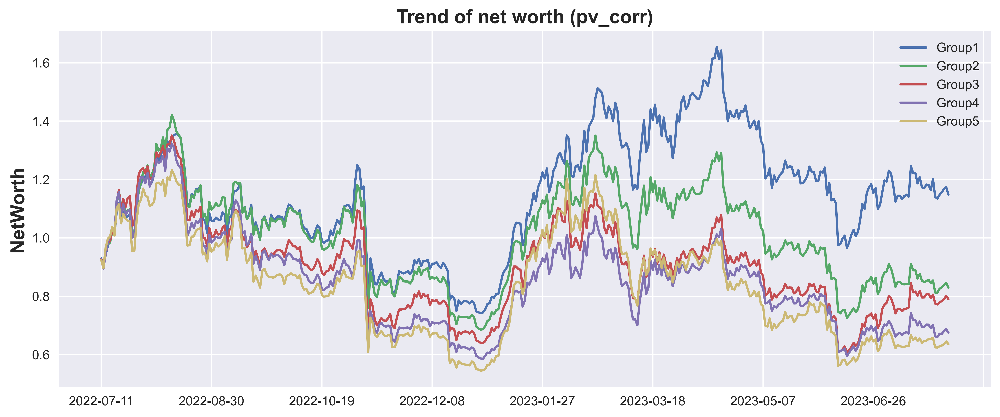

In [13]:
net_week_2022 = cf_plus.networth_trend(factor_type='pv_corr')

pt = Plot()
pt.trend_plot(df = net_week_2022, title='pv_corr')

100%|████████████████████████████████████████████████████████████████████████████████| 133/133 [08:18<00:00,  3.75s/it]


spend time: 498.737


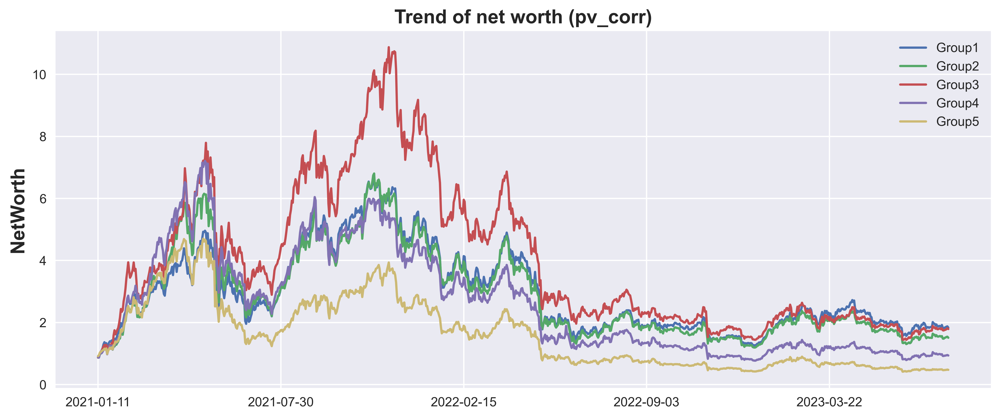

In [26]:
cf_plus_2021 = ComputeFactors(group_num = 5, start='2021-01', end='2023-08', freq = 'week')

begin = time.time()
net_week_2021 = cf_plus_2021.networth_trend(factor_type='pv_corr')

pv_corr_week_std_2021 = cf_plus_2021.pv_corr_(factor_type='std')
pv_corr_week_avg_2021 = cf_plus_2021.pv_corr_(factor_type='avg')
pv_corr_week_2021 = cf_plus_2021.pv_corr()
return_week_2021 = cf_plus_2021.return_calculate()

print(f"spend time: {round(time.time() - begin, 3)}")

pt = Plot()
pt.trend_plot(df = net_week_2021, title='pv_corr')

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [01:12<00:00,  2.51s/it]


spend time: 72.965


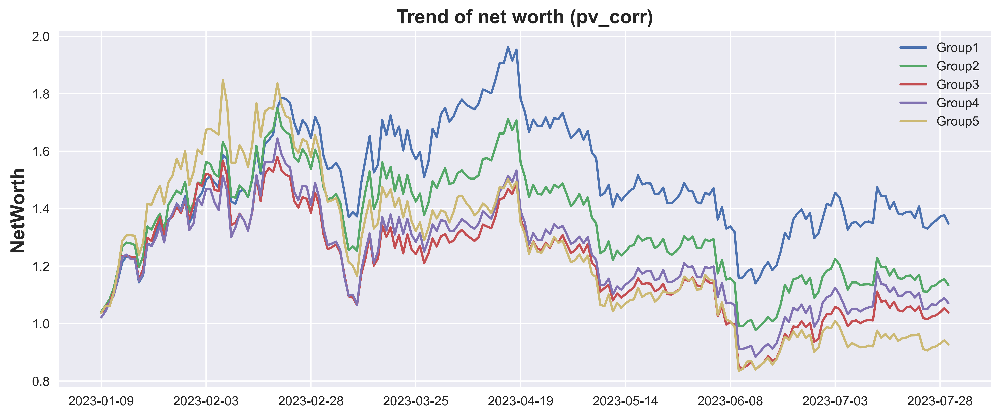

In [27]:
cf_plus_2023 = ComputeFactors(group_num = 5, start='2023-01', end='2023-08', freq = 'week')


begin = time.time()
net_week_2023 = cf_plus_2023.networth_trend(factor_type='pv_corr')

pv_corr_week_std_2023 = cf_plus_2023.pv_corr_(factor_type='std')
pv_corr_week_avg_2023 = cf_plus_2023.pv_corr_(factor_type='avg')
pv_corr_week_2023 = cf_plus_2023.pv_corr()
return_week_2023 = cf_plus_2023.return_calculate()

print(f"spend time: {round(time.time() - begin, 3)}")

pt = Plot()
pt.trend_plot(df = net_week_2023, title='pv_corr')

### 以下为按月分组运行的净值走势

In [115]:
import time
cf = ComputeFactors(start='2021-01', end='2023-08')

In [61]:
#计算IC & RankIC & ICIR
begin = time.time()

pv_corr_avg_2021 = cf.pv_corr_(factor_type='avg')
pv_corr_std_2021 = cf.pv_corr_(factor_type='std')
pv_corr_2021 = cf.pv_corr()
return_2021 = cf.return_calculate()
pv_corr_daily_2021 = cf.daily_correlation()

IC_2021 = cf.IC() 
rank_IC_2021 = cf.IC(rank=True)
ICIR_2021 = IC_2021.mean() / IC_2021.std()

print(f"spend time: {round(time.time() - begin, 3)}")
print(f"ICIR of 2021-2023 is: {ICIR_2021}")

spend time: 1340.002
ICIR of 2021-2023 is: -0.21103701466964303


In [62]:
IC_2021_df = pd.DataFrame({'IC': pd.Series(IC_2021)})
IC_2021_df['Rank_IC']= pd.DataFrame(pd.Series(rank_IC_2021))

IC_2021_num = sum_sign(IC_2021, "IC")
RankIC_2021_num = sum_sign(rank_IC_2021, "rank_IC")

IC_2021_df

Days with IC > 0.04: 292
Days with IC < -0.04: 462
Days with IC > 0.04 or IC < -0.04:754 while total days is:941
Days with rank_IC > 0.04: 172
Days with rank_IC < -0.04: 577
Days with rank_IC > 0.04 or rank_IC < -0.04:749 while total days is:941


,IC,Rank_IC
2021-01-02,0.172856,-0.051360
2021-01-03,0.311637,0.408392
2021-01-04,0.236200,0.170183
2021-01-05,-0.095563,-0.102039
2021-01-06,0.211785,0.069667
...,...,...
2023-07-27,-0.097202,-0.038318
2023-07-28,0.096462,-0.026488
2023-07-29,-0.112507,-0.178539
2023-07-30,0.035667,0.086905


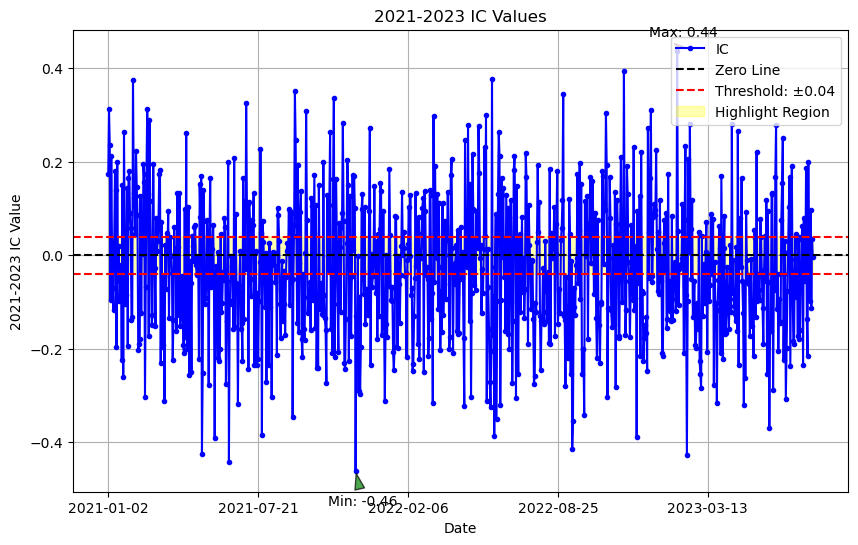

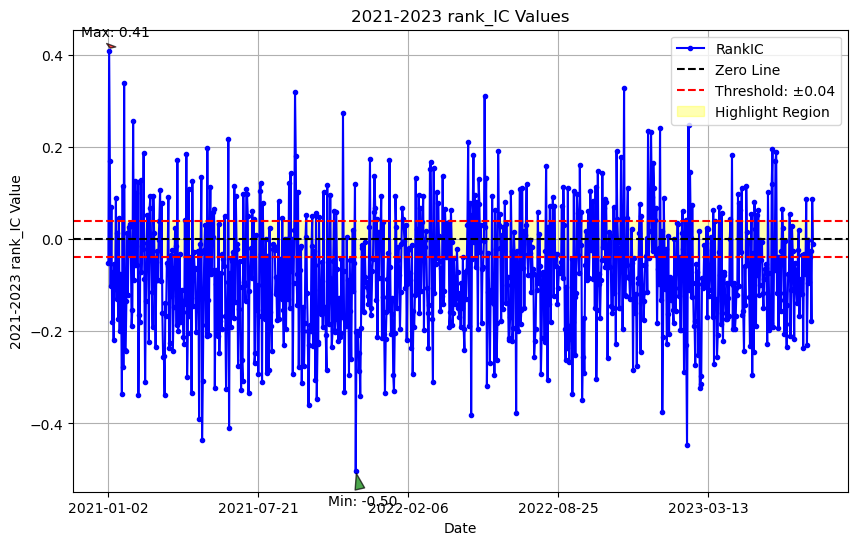

In [11]:
visual_IC(IC_2021, "2021-2023", "IC")
visual_IC(rank_IC_2021,"2021-2023", "rank_IC")

### 计算2023年IC指标

In [63]:
import time
cf_2023 = ComputeFactors(start='2023-01', end='2023-08')

In [69]:
pv_corr_avg_2023 = cf_2023.pv_corr_(factor_type='avg')
pv_corr_std_2023 = cf_2023.pv_corr_(factor_type='std')
pv_corr_2023 = cf_2023.pv_corr()
return_2023 = cf_2023.return_calculate()
pv_corr_daily_2023 = cf_2023.daily_correlation()

In [113]:
pv_corr_avg_2023

,2023-01,2023-02,2023-03,2023-04,2023-05,2023-06,2023-07
symbol,,,,,,,
1000LUNCBUSD,0.058811,0.007957,-0.029479,0.033197,-0.011236,-0.012684,NaN
1000LUNCUSDT,0.098493,0.033540,-0.001488,0.055069,-0.004085,0.102662,0.044163
1000SHIBBUSD,0.103534,0.035074,-0.013326,0.006756,-0.030400,0.341097,NaN
1000SHIBUSDT,0.109847,0.036406,0.002172,0.023504,-0.027733,-0.006049,0.084683
1000XECUSDT,0.106652,0.036790,-0.046849,0.030815,-0.013245,0.033524,0.199609
...,...,...,...,...,...,...,...
XVGUSDT,NaN,NaN,NaN,NaN,NaN,NaN,0.085393
WLDUSDT,NaN,NaN,NaN,NaN,NaN,NaN,0.076990
ARKMUSDT,NaN,NaN,NaN,NaN,NaN,NaN,0.037651


In [127]:
return_2023

,2023-01-01,2023-01-02,2023-01-03,2023-01-04,2023-01-05,2023-01-06,2023-01-07,2023-01-08,2023-01-09,2023-01-10,...,2023-07-22,2023-07-23,2023-07-24,2023-07-25,2023-07-26,2023-07-27,2023-07-28,2023-07-29,2023-07-30,2023-07-31
symbol,,,,,,,,,,,,,,,,,,,,,
1000LUNCBUSD,NaN,0.060505,-0.022571,0.013470,-0.037975,0.026316,-0.017949,0.033290,0.070120,-0.016529,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1000LUNCUSDT,NaN,0.061211,-0.022571,0.014112,-0.038583,0.026316,-0.017949,0.033943,0.070076,-0.017109,...,-0.011335,-0.011695,-0.050116,-0.002198,-0.003550,-0.010195,0.017622,-0.000488,-0.010005,-0.008750
1000SHIBBUSD,NaN,0.007755,-0.005374,0.027385,-0.000837,0.008494,-0.001661,0.027448,0.003469,0.068457,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1000SHIBUSDT,NaN,0.006888,-0.004886,0.027866,-0.000955,0.007890,-0.001305,0.027791,0.003120,0.068425,...,-0.008296,0.010425,-0.023819,0.032098,-0.007206,-0.007386,0.048877,0.041707,-0.027709,0.021616
1000XECUSDT,NaN,0.007692,-0.016165,0.075764,0.041578,0.002444,-0.019911,0.021144,0.021518,0.009539,...,-0.026667,0.009132,-0.045895,-0.003049,0.003738,0.002370,0.005066,0.015793,0.035065,-0.014062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
XVGUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.049677,0.012644,-0.079202,-0.080753,0.021136,-0.011212,0.018535,-0.000428,-0.010923,0.121481
WLDUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.044831,-0.002615,-0.069019,0.057762,0.058354,-0.024647,0.012198
ARKMUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.042251,-0.028126,0.007730


In [14]:
#计算IC & RankIC & ICIR
begin = time.time()

IC_2023 = cf_2023.IC()
rank_IC_2023 = cf_2023.IC(rank=True)
ICIR_2023 = IC_2023.mean() / IC_2023.std()

print(f"spend time: {round(time.time() - begin, 3)}")
print(f"ICIR of 2023 is: {ICIR_2023}")

spend time: 170.623
ICIR of 2023 is: -0.06606137879703045


In [15]:
IC_2023_df = pd.DataFrame({'IC_2023': pd.Series(IC_2023)})
IC_2023_df['Rank_IC_2023']= pd.DataFrame(pd.Series(rank_IC_2023))

IC_num = sum_sign(IC_2023, "IC_2023")
RankIC_num = sum_sign(rank_IC_2023, "rank_IC_2023")

IC_2023_df

Days with IC_2023 > 0.04: 60
Days with IC_2023 < -0.04: 71
Days with IC_2023 > 0.04 or IC_2023 < -0.04:131 while total days is:211
Days with rank_IC_2023 > 0.04: 54
Days with rank_IC_2023 < -0.04: 81
Days with rank_IC_2023 > 0.04 or rank_IC_2023 < -0.04:135 while total days is:211


,IC_2023,Rank_IC_2023
2023-01-02,-0.182468,-0.033247
2023-01-03,0.135253,0.112578
2023-01-04,0.007412,-0.038760
2023-01-05,0.038807,0.011489
2023-01-06,0.102875,0.085843
...,...,...
2023-07-27,0.075479,0.032035
2023-07-28,0.014041,0.044276
2023-07-29,-0.026723,-0.089734
2023-07-30,-0.077652,-0.008915


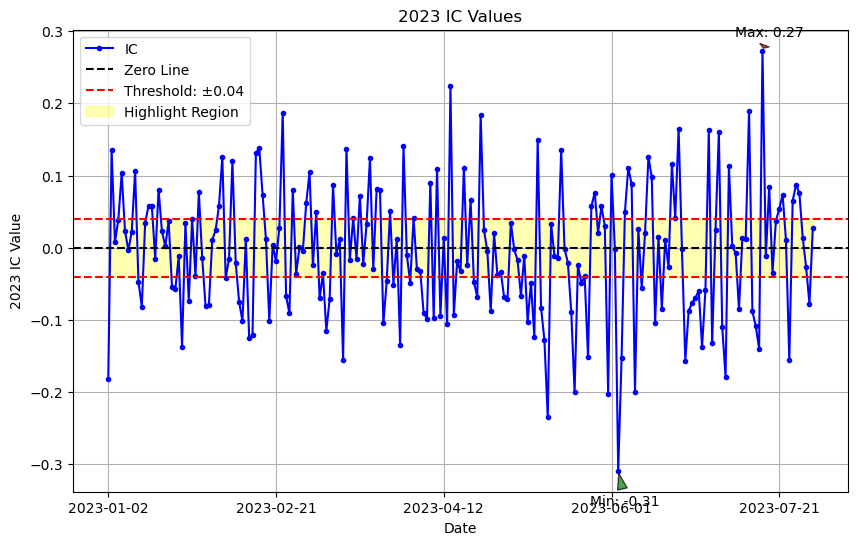

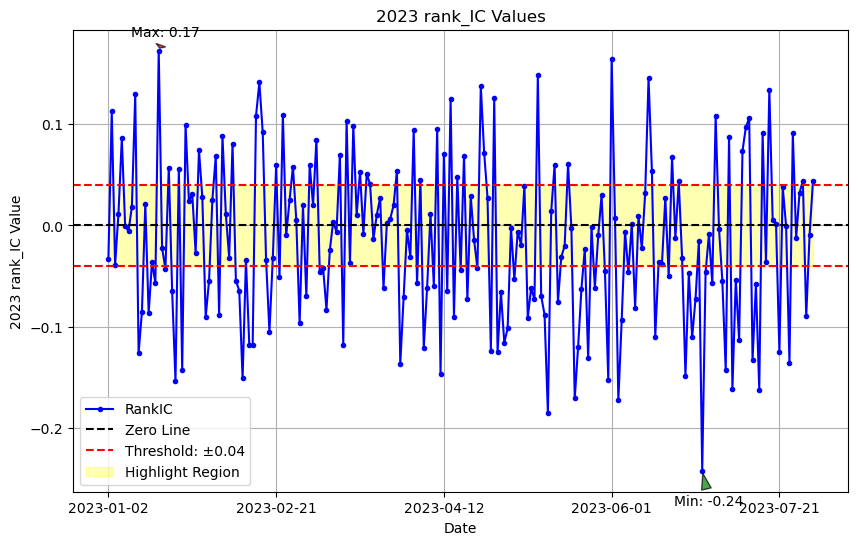

In [52]:
visual_IC(IC_2023, 2023, "IC")
visual_IC(rank_IC_2023, 2023, "rank_IC")

### 计算2022年IC指标

In [70]:
cf_2022 = ComputeFactors(start='2022-01', end='2023-08')

In [71]:
#计算IC & RankIC & ICIR
begin = time.time()

pv_corr_avg_2022 = cf_2022.pv_corr_(factor_type='avg')
pv_corr_std_2022 = cf_2022.pv_corr_(factor_type='std')
pv_corr_2022 = cf_2022.pv_corr()
return_2022 = cf_2022.return_calculate()
# return_diagram_2022 = cf_2022.return_calculate()
pv_corr_daily_2022 = cf_2022.daily_correlation()

IC_2022 = cf_2022.IC()
rank_IC_2022 = cf_2022.IC(rank=True)
ICIR_2022 = IC_2022.mean() / IC_2022.std()

print(f"spend time: {round(time.time() - begin, 3)}")
print(f"ICIR of 2022 is: {ICIR_2022}")

spend time: 871.984
ICIR of 2022 is: -0.24110711408172888


In [21]:
return_2022 = return_diagram_2022

In [72]:
IC_2022_df = pd.DataFrame({'IC_2022': pd.Series(IC_2022)})
IC_2022_df['Rank_IC_2022']= pd.DataFrame(pd.Series(rank_IC_2022))
IC_2022_df

,IC_2022,Rank_IC_2022
2022-01-02,-0.169683,-0.215127
2022-01-03,-0.133756,-0.126798
2022-01-04,0.094922,0.036553
2022-01-05,-0.146630,-0.206792
2022-01-06,-0.310900,-0.333361
...,...,...
2023-07-27,-0.097202,-0.037838
2023-07-28,0.096462,-0.026091
2023-07-29,-0.112507,-0.178721
2023-07-30,0.035667,0.086837


In [272]:
IC_2022_num = sum_sign(IC_2022, "IC_2022")
RankIC_2022_num = sum_sign(rank_IC_2022, "rank_IC_2022")

Days with IC_2022 > 0.04: 170
Days with IC_2022 < -0.04: 289
Days with IC_2022 > 0.04 or IC_2022 < -0.04:459 while total days is:576
Days with rank_IC_2022 > 0.04: 105
Days with rank_IC_2022 < -0.04: 341
Days with rank_IC_2022 > 0.04 or rank_IC_2022 < -0.04:446 while total days is:576


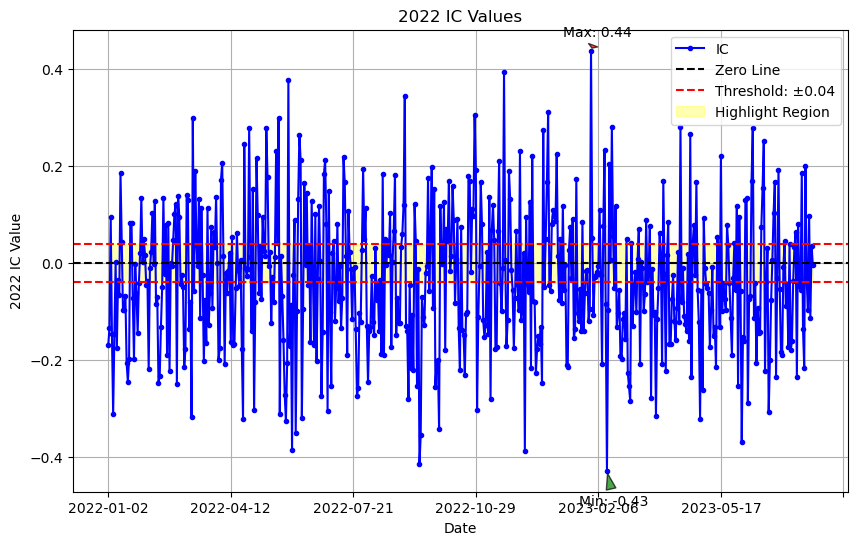

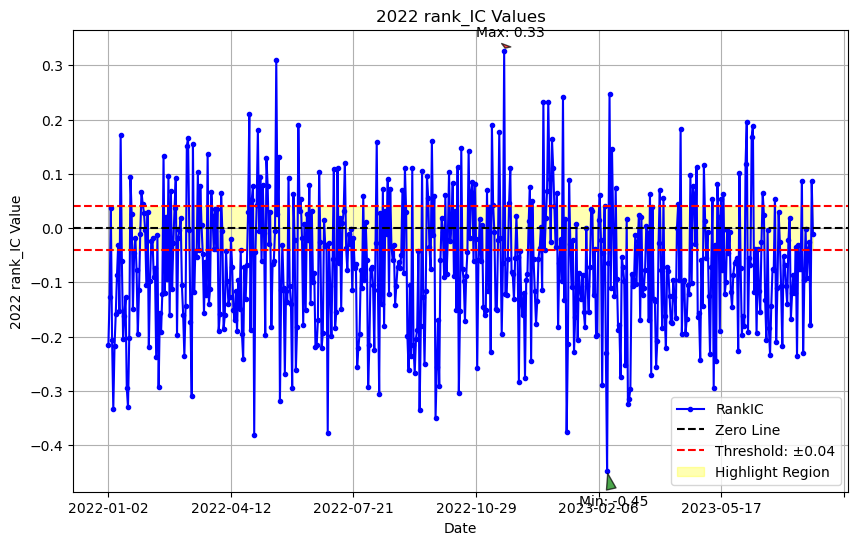

In [273]:
visual_IC(IC_2022, 2022, "IC")
visual_IC(rank_IC_2022, 2022, "rank_IC")

### 2021 vs. 2023 IC指标分布情况
#### 直方图

#### 核密度估计
- 是一种通过对数据进行平滑处理来估计概率密度函数（PDF）的方法。

- 核密度估计可以得到整体的概率密度估计，从而近似表示数据的真实分布。

- 在核密度估计的结果图中，数值表示了在不同位置处的概率密度值。这意味着数值越高的地方，数据点越密集，概率密度越大。

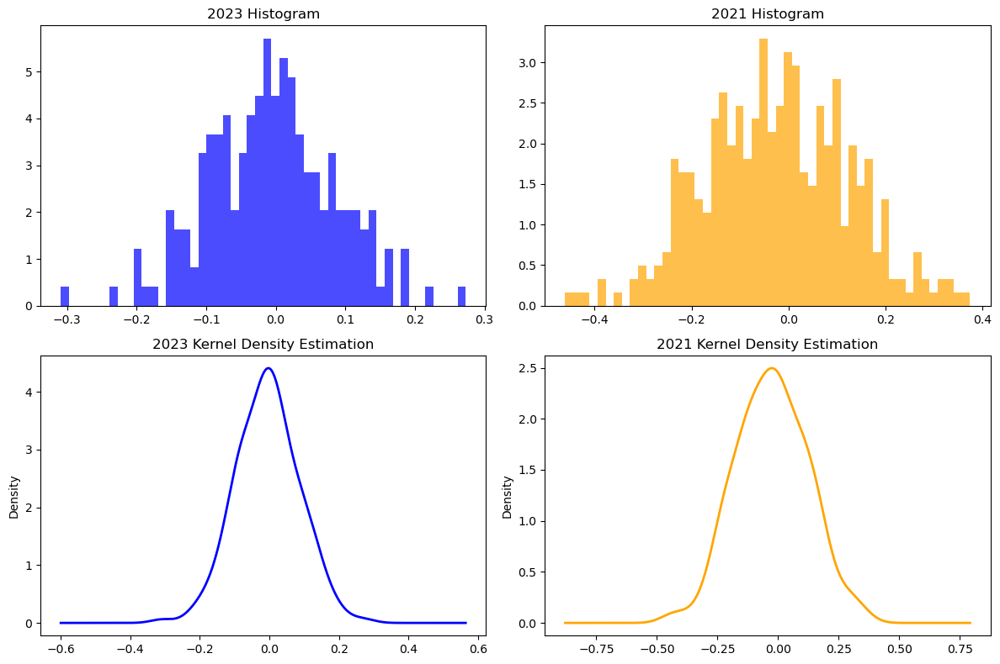

In [53]:
import matplotlib.pyplot as plt

# 创建一个2行2列的子图布局
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

# 绘制23年的直方图
axes[0, 0].hist(IC_2023, bins=50, color='blue', alpha=0.7, density=True)
axes[0, 0].set_title('2023 Histogram')

# 绘制21年的直方图
axes[0, 1].hist(IC_2021, bins=50, color='orange', alpha=0.7, density=True)
axes[0, 1].set_title('2021 Histogram')

# 绘制23年的核密度图
IC_2023.plot(kind='kde', ax=axes[1, 0], color='blue', linewidth=2)
axes[1, 0].set_title('2023 Kernel Density Estimation')

# 绘制21年的核密度图
IC_2021.plot(kind='kde', ax=axes[1, 1], color='orange', linewidth=2)
axes[1, 1].set_title('2021 Kernel Density Estimation')

# 调整子图布局
plt.tight_layout()

# sns.heatmap([IC_2023, IC_2021], cmap='YlGnBu', annot=True, fmt='.2f', ax=axes[2, :])

plt.show()

#### 箱线图

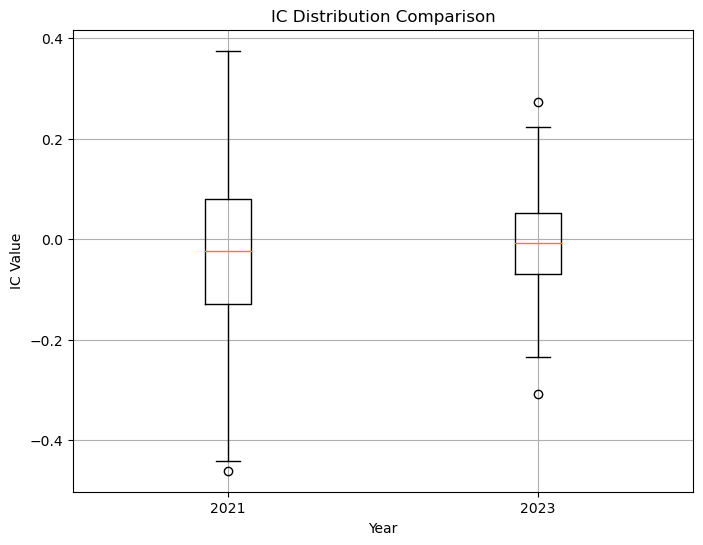

In [72]:
import matplotlib.pyplot as plt

# 假设IC_2021和IC_2023分别是包含IC值的pd.Series
data = [IC_2021, IC_2023]
labels = ['2021', '2023']

plt.figure(figsize=(8, 6))
plt.boxplot(data, labels=labels)
plt.title('IC Distribution Comparison')
plt.xlabel('Year')
plt.ylabel('IC Value')
plt.grid(True)
plt.show()

#### heatmap

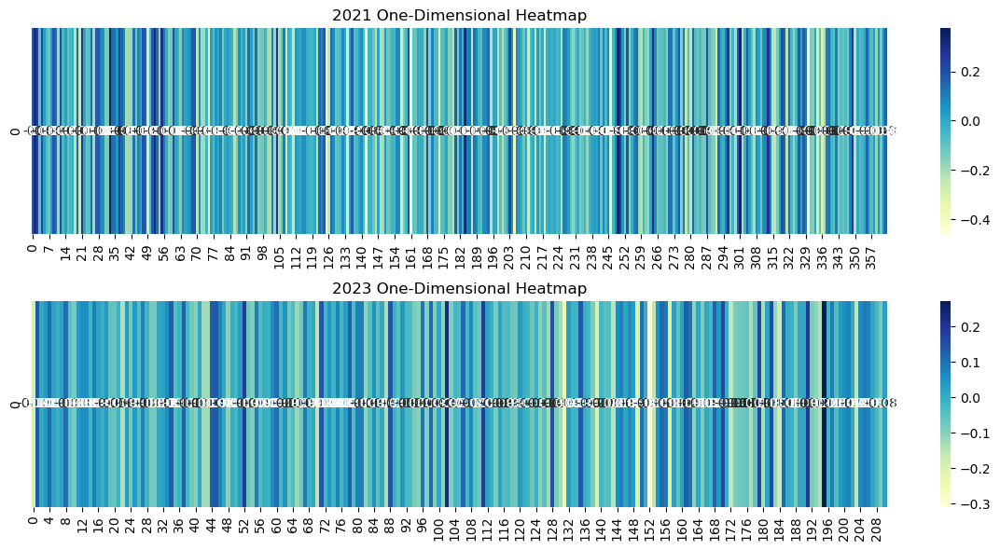

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns

# 创建一个1行2列的子图布局
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 6))

# 创建21年的一维热图
sns.heatmap([IC_2021], cmap='YlGnBu', annot=True, fmt='.2f', ax=axes[0])
axes[0].set_title('2021 One-Dimensional Heatmap')

# 创建23年的一维热图
sns.heatmap([IC_2023], cmap='YlGnBu', annot=True, fmt='.2f', ax=axes[1])
axes[1].set_title('2023 One-Dimensional Heatmap')

# 调整子图布局
plt.tight_layout()

plt.show()

# 因子5分组回测净值走势【使用pv_corr_avg作为因子】
## 分组功能

In [108]:
# 为每个月的因子值分组并排序
groups = pv_corr_2022.apply(lambda x: pd.qcut(x, q=5, labels=False, duplicates='drop'), axis=0)
groups

,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06,2022-07,2022-08,2022-09,2022-10,2022-11,2022-12,2023-01,2023-02,2023-03,2023-04,2023-05,2023-06,2023-07
symbol,,,,,,,,,,,,,,,,,,,
1000SHIBUSDT,0.0,4.0,1.0,3.0,0.0,1.0,2.0,3.0,3.0,4.0,1.0,0.0,3.0,2.0,2.0,3.0,0.0,2.0,4.0
1000XECUSDT,0.0,0.0,3.0,4.0,3.0,3.0,2.0,3.0,4.0,1.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,3.0,4.0
1INCHUSDT,2.0,3.0,2.0,2.0,1.0,3.0,2.0,4.0,2.0,4.0,1.0,0.0,1.0,4.0,3.0,0.0,0.0,1.0,4.0
AAVEUSDT,1.0,0.0,3.0,3.0,2.0,0.0,4.0,3.0,2.0,2.0,0.0,2.0,2.0,2.0,3.0,0.0,2.0,4.0,4.0
ADABUSD,3.0,2.0,2.0,2.0,2.0,1.0,3.0,2.0,2.0,4.0,0.0,0.0,3.0,1.0,4.0,3.0,2.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
XVGUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WLDUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ARKMUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 开始尝试进行净值的分组计算
1. 先求每个月每个组别Return的均值
2. 结果+1
3. 用递归方法乘以前一天的净值（初始净值=1，下一天的净值=前一天净值*（1+Return.mean()））
4. 获得每个月每个组别的平均净值
5. 横轴为时序月份，纵轴为每月每组别的平均净值，绘图

## 净值走势功能实现，更准确一些
- 考虑了每个币种每天的净值波动
先前的计算方法可能存在一些问题，下面这样计算5组在该月里每天的净值：该组中每个币种i在第t天的下一天Return为R_{ti}，先横向计算出该组中每个币种在该月的Return加上1的累乘值得到该币种i在该月每天的净值，随后再纵向取这个特定组别的净值均值得到该组别在该月每天的净值均值。
因此，我现在想使用的这个方法是先计算每个币种每天的净值随后按照组别取平均，而之前的方法是先按照组别取每天的Return平均值再加上1后累乘得到净值
#### 定义了两个函数，分别是计算每组每天净值，可视化

In [57]:
import pandas as pd
import numpy as np

def net_value(group_num, pv_corr_avg, returns):
    # 为每个月的因子值分组并排序
    groups = pv_corr_avg.apply(lambda x: pd.qcut(x, q=group_num, labels=False, duplicates='drop'), axis=0)
    
    group_order = [f'Group {i + 1}' for i in range(group_num)]

    # 获取每个月的第一个日期
    month_starts = pd.to_datetime(pv_corr_avg.columns)

    # 初始化上个月末的组净值
    prev_month_group_net_values = pd.Series(index=group_order, dtype=float)
    
    #要返回的最终变量，为5分组每天的净值走势，index为日期，column为group_num
    group_return_avg = pd.DataFrame()

    for i, start_date in enumerate(month_starts[:-1]):

        if i < (len(month_starts) - 2):
            next_month_start = month_starts[i + 1]
            next_month_end = month_starts[i + 2]
            relevant_columns = returns.columns[(returns.columns >= str(next_month_start.date())) & (returns.columns <= str(next_month_end.date()))]
            next_month_returns = returns[relevant_columns].iloc[:, :-1]
        else:
            next_month_start = pd.to_datetime(pv_corr_avg.columns[-1])
            relevant_columns = returns.columns[(returns.columns >= str(next_month_start.date()))]
            next_month_returns = returns[relevant_columns]

        group_return_avg_temp2 = pd.DataFrame(index=next_month_returns.columns)

        net_values = (1 + next_month_returns).cumprod(axis=1)

        for group_num in groups[str(start_date)[:7]].unique():
            if pd.notna(group_num):  # 忽略 NaN 组别
                coins_in_group = groups[groups[str(start_date)[:7]] == group_num].index
                value_for_group = net_values.loc[coins_in_group]
                if i == 0: #如果是第一个月则初始净值为1
                    group_return_avg_temp2[f'Group {int(group_num + 1)}'] = value_for_group.mean(axis=0,skipna=True)
                else:  #若不是第一个月则需要乘以前一个月该组的净值
                    adjusted_values = value_for_group * prev_month_group_net_values[int(group_num)]
                    group_return_avg_temp2[f'Group {int(group_num + 1)}'] = adjusted_values.mean(axis=0,skipna=True)
                # 更新上个月末的组净值
                if pd.isna(prev_month_group_net_values[int(group_num)]):
                    prev_month_group_net_values[int(group_num)] = value_for_group.iloc[:, -1].mean()
                else:
                    prev_month_group_net_values[int(group_num)] *= value_for_group.iloc[:, -1].mean()
                    
        group_return_avg_temp2 = group_return_avg_temp2[group_order]
        group_return_avg = pd.concat([group_return_avg,group_return_avg_temp2], ignore_index=False)
        
    return group_return_avg

In [195]:
# 加上费率之后的，多空1和5组，分别减掉和加上5bps的费率

import pandas as pd
import numpy as np

def net_value_fee(group_num, pv_corr_avg, returns):
    fee = 0.0005
    # 为每个月的因子值分组并排序
    groups = pv_corr_avg.apply(lambda x: pd.qcut(x, q=group_num, labels=False, duplicates='drop'), axis=0)
    
    group_order = [f'Group {i + 1}' for i in range(group_num)]

    # 获取每个月的第一个日期
    month_starts = pd.to_datetime(pv_corr_avg.columns)

    # 初始化上个月末的组净值
    prev_month_group_net_values = pd.Series(index=group_order, dtype=float)
    
    #要返回的最终变量，为5分组每天的净值走势，index为日期，column为group_num
    group_return_avg = pd.DataFrame()

    for i, start_date in enumerate(month_starts[:-1]):

        if i < (len(month_starts) - 2):
            next_month_start = month_starts[i + 1]
            next_month_end = month_starts[i + 2]
            relevant_columns = returns.columns[(returns.columns >= str(next_month_start.date())) & (returns.columns <= str(next_month_end.date()))]
            next_month_returns = returns[relevant_columns].iloc[:, :-1]
        else:
            next_month_start = pd.to_datetime(pv_corr_avg.columns[-1])
            relevant_columns = returns.columns[(returns.columns >= str(next_month_start.date()))]
            next_month_returns = returns[relevant_columns]

        group_return_avg_temp2 = pd.DataFrame(index=next_month_returns.columns)
        
        #Group 1 要每个月的第一天和最后一天要加上一个fee
        coins_in_group1 = groups[groups[str(start_date)[:7]] == 0].index
        return_for_group1 = next_month_returns.loc[coins_in_group1]
        return_for_group1.iloc[:, 0] = return_for_group1.iloc[:, 0] - fee # 减去第一列的 fee
        return_for_group1.iloc[:, -1] = return_for_group1.iloc[:, -1] - fee # 减去最后一列的 fee
        net_values_group1 = (1 + return_for_group1).cumprod(axis=1)

        #Group 5 要每个月的第一天和最后一天要减掉一个fee
        coins_in_group5 = groups[groups[str(start_date)[:7]] == 4].index
        return_for_group5 = next_month_returns.loc[coins_in_group5]
        return_for_group5.iloc[:, 0] = return_for_group5.iloc[:, 0] + fee # 减去第一列的 fee
        return_for_group5.iloc[:, -1] = return_for_group5.iloc[:, -1] + fee # 减去最后一列的 fee
        net_values_group5 = (1 + return_for_group5).cumprod(axis=1)

        if i == 0: #如果是第一个月则初始净值为1
            group_return_avg_temp2[f'Group 1'] = net_values_group1.mean(axis=0,skipna=True)
            group_return_avg_temp2[f'Group 5'] = net_values_group5.mean(axis=0,skipna=True)
        else:  #若不是第一个月则需要乘以前一个月该组的净值
            adjusted_values_group1 = net_values_group1 * prev_month_group_net_values[0]
            adjusted_values_group5 = net_values_group5 * prev_month_group_net_values[4]
            group_return_avg_temp2[f'Group 1'] = adjusted_values_group1.mean(axis=0,skipna=True)
            group_return_avg_temp2[f'Group 5'] = adjusted_values_group5.mean(axis=0,skipna=True)

        # 更新上个月末的组净值
        if pd.isna(prev_month_group_net_values[0]):
            prev_month_group_net_values[0] = net_values_group1.iloc[:, -1].mean()
        else:
            prev_month_group_net_values[0] *= net_values_group1.iloc[:, -1].mean()
        if pd.isna(prev_month_group_net_values[4]):
            prev_month_group_net_values[4] = net_values_group5.iloc[:, -1].mean()
        else:
            prev_month_group_net_values[4] *= net_values_group5.iloc[:, -1].mean()

        group_return_avg = pd.concat([group_return_avg,group_return_avg_temp2], ignore_index=False)
        
    return group_return_avg

In [190]:
group_return_avg

,Group 1,Group 5
2022-02-01,1.016792,1.003749
2022-02-02,0.970192,0.958233
2022-02-03,0.986967,0.974208
2022-02-04,1.078761,1.051423
2022-02-05,1.101418,1.068930
...,...,...
2023-07-27,0.495553,0.318748
2023-07-28,0.499381,0.322727
2023-07-29,0.503740,0.326161
2023-07-30,0.492993,0.321477


In [58]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def visual(net_value):
    # 创建一个绘图区域
    plt.figure(figsize=(10, 6))

    # 循环遍历不同组别，绘制时序净值走势图
    for group in net_value.columns:
        plt.plot(pd.to_datetime(net_value.index), net_value[group], label=f'Group {group}')

    # 添加图例、标题和标签
    plt.legend()
    plt.title('Time Series Net Value for Different Groups')
    plt.xlabel('Date')
    plt.ylabel('Net Value')


    # 显示图表
    plt.show()

#### 2023年的pv_corr_avg作为指标绘制净值走势

In [166]:
net_value_2023 = net_value(5, pv_corr_avg_2023, return_2023)

In [196]:
net_value_fee_2023 = net_value_fee(5, pv_corr_avg_2023, return_2023)

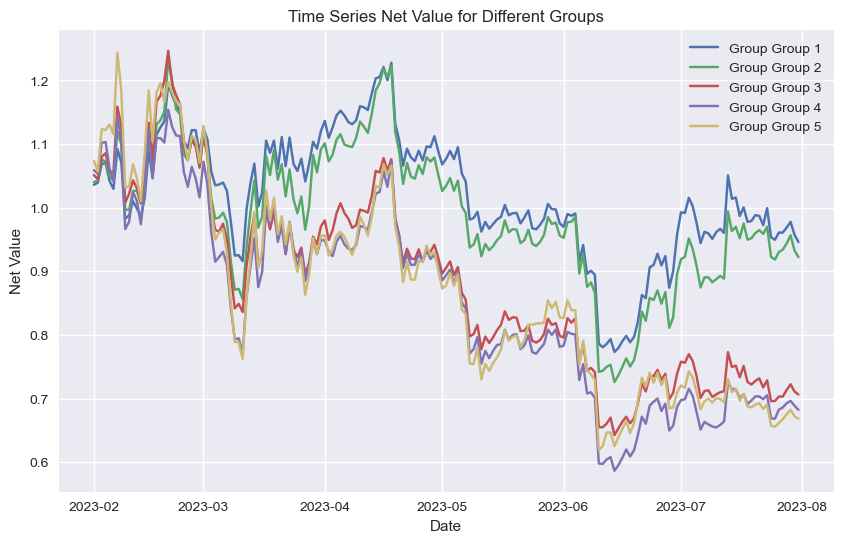

,Group 1,Group 2,Group 3,Group 4,Group 5
2023-02-01,1.035959,1.040194,1.051221,1.059059,1.073529
2023-02-02,1.039284,1.042984,1.044956,1.053221,1.057015
2023-02-03,1.068596,1.076068,1.080110,1.101967,1.123458
2023-02-04,1.070209,1.072240,1.085705,1.103306,1.122180
2023-02-05,1.042151,1.049595,1.056759,1.060955,1.130782
...,...,...,...,...,...
2023-07-27,0.960877,0.934067,0.703151,0.685904,0.667290
2023-07-28,0.968778,0.943821,0.713458,0.692627,0.675287
2023-07-29,0.977719,0.956665,0.722414,0.696389,0.682133
2023-07-30,0.957348,0.932768,0.711017,0.688652,0.671998


In [79]:
visual(net_value_2023)
net_value_2023

#### 2022-2023年的pv_corr_avg作为指标绘制净值走势

In [85]:
net_value_2022 = net_value(5, pv_corr_2022, return_2022)

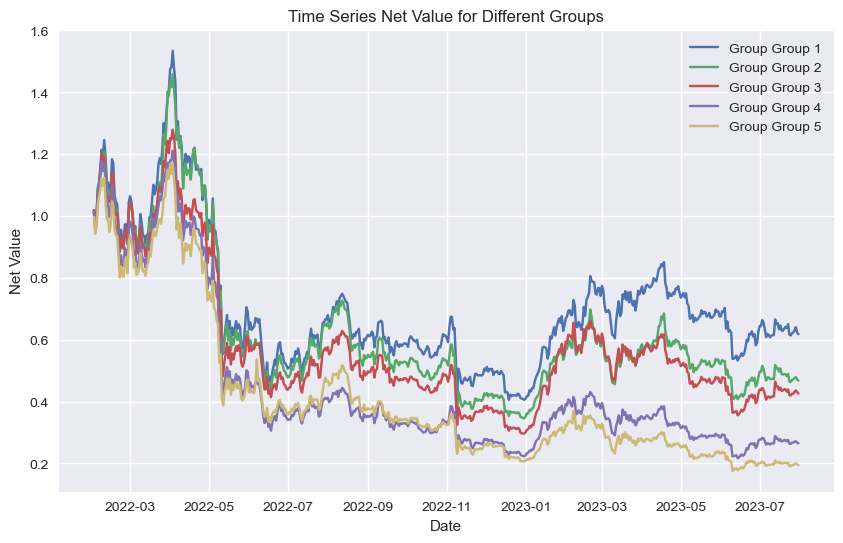

,Group 1,Group 2,Group 3,Group 4,Group 5
2022-02-01,1.018812,1.010453,1.018405,1.015573,0.997389
2022-02-02,0.970941,0.969706,0.973395,0.960837,0.942687
2022-02-03,0.987113,1.000566,0.993268,0.969691,0.961695
2022-02-04,1.090972,1.083629,1.075051,1.061574,1.034208
2022-02-05,1.109129,1.102130,1.102213,1.094493,1.063324
...,...,...,...,...,...
2023-07-27,0.623362,0.471734,0.425705,0.267730,0.195162
2023-07-28,0.630576,0.475831,0.431768,0.270091,0.197421
2023-07-29,0.640471,0.478944,0.436036,0.271559,0.200172
2023-07-30,0.623044,0.472000,0.430405,0.266958,0.196777


In [86]:
visual(net_value_2022)
net_value_2022

#### 2021-2023年的pv_corr_avg作为指标绘制净值走势

In [91]:
net_value_2021 = net_value(5, pv_corr_2021, return_2021)

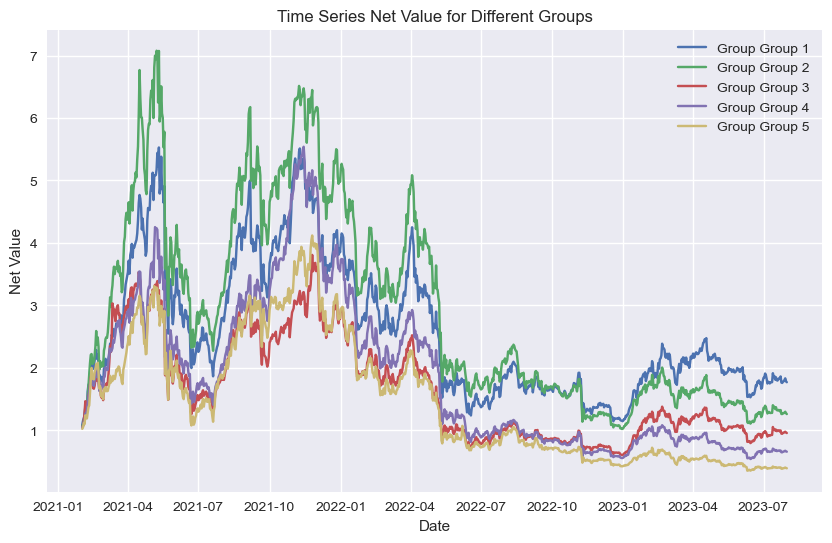

,Group 1,Group 2,Group 3,Group 4,Group 5
2021-02-01,1.090668,1.076974,1.050993,1.041535,1.025422
2021-02-02,1.155056,1.079889,1.072426,1.072852,1.051518
2021-02-03,1.198139,1.168166,1.153634,1.132530,1.117966
2021-02-04,1.236485,1.217736,1.290288,1.130484,1.100434
2021-02-05,1.388427,1.365254,1.467376,1.268411,1.240448
...,...,...,...,...,...
2023-07-27,1.786903,1.275680,0.962518,0.660820,0.394825
2023-07-28,1.807253,1.286346,0.972536,0.668947,0.399771
2023-07-29,1.833454,1.298493,0.978586,0.673959,0.405335
2023-07-30,1.784595,1.275448,0.966833,0.664145,0.398202


In [92]:
visual(net_value_2021)
net_value_2021

#### 2023年的pr_corr作为指标绘制净值走势

In [33]:
net_value_2023_3 = net_value(5, pv_corr_2023, return_2023)

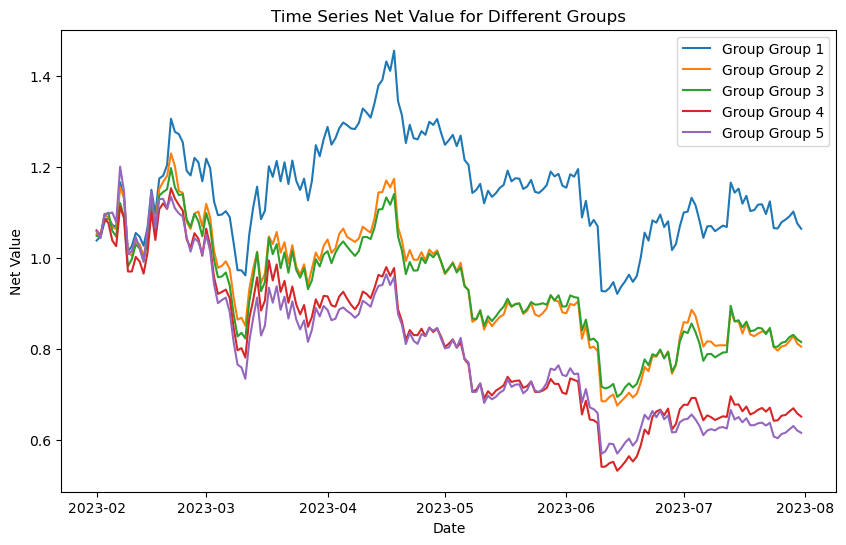

In [34]:
visual(net_value_2023_3)

#### 2022-2023年的pr_corr作为指标绘制净值走势

In [35]:
net_value_2022_3 = net_value(5, pv_corr_2022, return_2022)

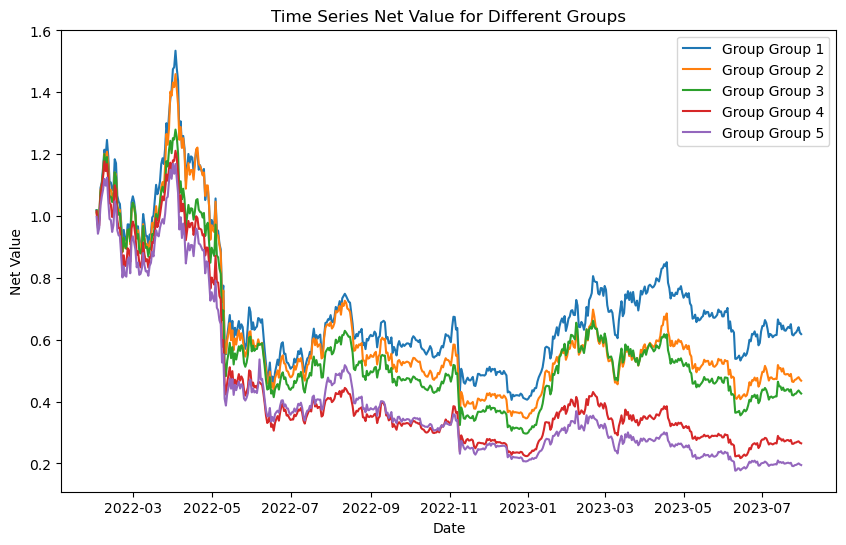

In [36]:
visual(net_value_2022_3)

#### 2021-2023年的pv_corr作为指标绘制净值走势

In [121]:
net_value_2021_3 = net_value(5, pv_corr_2021, return_2021)

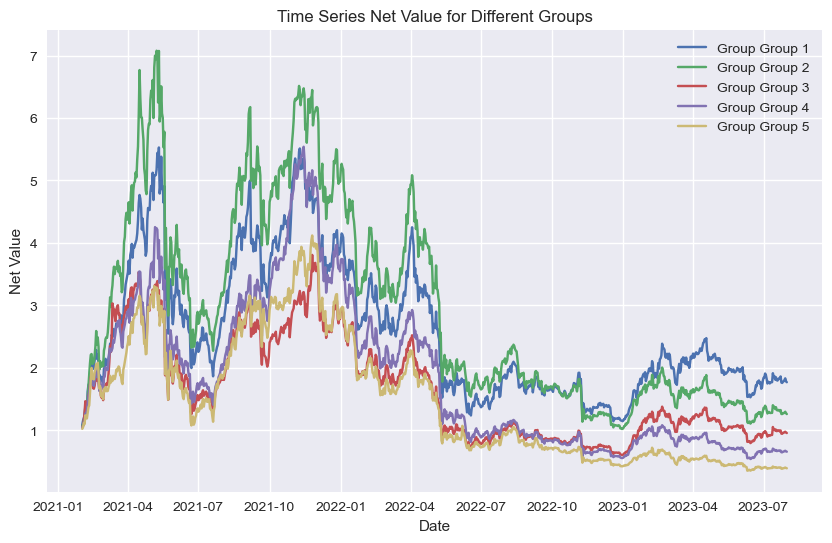

In [122]:
visual(net_value_2021_3)

### 计算多空和最大回撤

In [90]:
# 计算最大回撤
def calculate_drawdown(returns):
#     cum_returns = returns
    cum_returns = returns / returns.iloc[0]  # 计算累计收益率
    rolling_max = cum_returns.expanding().max()  # 计算每天的累计收益率的滚动最大值
    drawdown = (cum_returns - rolling_max) / rolling_max  # 计算回撤率
    max_drawdown = abs(drawdown.min())  # 找到最大回撤率
    max_drawdown_date = drawdown.idxmin()  # 找到最大回撤率对应的日期
    
    print("Max Drawdown:", max_drawdown)
    print("Max Drawdown Date:", max_drawdown_date)
    
    return max_drawdown

In [210]:
import numpy as np
import pandas as pd

trading_days_per_year = {2022: 334, 2023: 212}
total_holding_days = (ls_value_fee_2022.index[-1] - ls_value_fee_2022.index[0]).days + 1

# 计算最终投资组合价值
final_portfolio_value = ls_value_fee_2022.iloc[-1, 0]

# 计算年化收益率
annualized_return_2022 = (final_portfolio_value / ls_value_fee_2022.iloc[0, 0]) ** (trading_days_per_year[2022] / total_trading_days) - 1
annualized_return_2023 = (final_portfolio_value / ls_value_fee_2022.iloc[0, 0]) ** (trading_days_per_year[2023] / total_trading_days) - 1

# Calculate annualized std
annualized_std_2022 = np.std(ls_value_fee_2022['Long_Short_Net_Value'].pct_change()) * np.sqrt(trading_days_per_year[2022])
annualized_std_2023 = np.std(ls_value_fee_2022['Long_Short_Net_Value'].pct_change()) * np.sqrt(trading_days_per_year[2023])

# Calculate Sharpe ratio
risk_free_rate = 0.028  # Adjust this according to your requirements
sharpe_ratio_2022 = (annualized_return_2022 - risk_free_rate) / annualized_std_2022
sharpe_ratio_2023 = (annualized_return_2023 - risk_free_rate) / annualized_std_2023

# Calculate Calmar ratio
max_drawdown_2022 = calculate_drawdown(ls_value_fee_2022).max()
max_drawdown_2023 = calculate_drawdown(ls_value_fee_2023).max()
calmar_ratio_2022 = annualized_return_2022 / max_drawdown_2022
calmar_ratio_2023 = annualized_return_2023 / max_drawdown_2023

# 计算换手率
# turnover = calculate_turnover(trade_data)

# 计算持仓周期
# holding_duration = calculate_holding_duration(trade_data)

# 计算胜率
win_rate_2022 = calculate_win_rate(ls_value_fee_2022)
win_rate_2023 = calculate_win_rate(ls_value_fee_2023)
win_rate_2021 = calculate_win_rate(ls_value_fee_2021)

# 打印计算出的指标
print(f"Final Portfolio Value: {final_portfolio_value:.4%}")
print(f"Annualized Return 2022: {annualized_return_2022:.4%}")
print(f"Annualized Return 2023: {annualized_return_2023:.4%}")
print(f"Annualized Std 2022: {annualized_std_2022:.4%}")
print(f"Annualized Std 2023: {annualized_std_2023:.4%}")
print(f"Sharpe Ratio 2022: {sharpe_ratio_2022:.4%}")
print(f"Sharpe Ratio 2023: {sharpe_ratio_2023:.4%}")
print(f"Calmar Ratio 2022: {calmar_ratio_2022:.4%}")
print(f"Calmar Ratio 2023: {calmar_ratio_2023:.4%}")
# print("Turnover:", turnover)
# print("Holding Duration:", holding_duration)
print(f"Win Rate 2021: {win_rate_2021:.2%}")
print(f"Win Rate 2022: {win_rate_2022:.2%}")
print(f"Win Rate 2023: {win_rate_2023:.2%}")

Max Drawdown: Long_Short_Net_Value    0.104854
dtype: float64
Max Drawdown Date: Long_Short_Net_Value   2022-06-07
dtype: datetime64[ns]
Max Drawdown: Long_Short_Net_Value    0.067642
dtype: float64
Max Drawdown Date: Long_Short_Net_Value   2023-02-07
dtype: datetime64[ns]
Final Portfolio Value: 119.0571%
Annualized Return 2022: 10.8190%
Annualized Return 2023: 6.7377%
Annualized Std 2022: 11.4996%
Annualized Std 2023: 9.1617%
Sharpe Ratio 2022: 69.7330%
Sharpe Ratio 2023: 42.9804%
Calmar Ratio 2022: 103.1819%
Calmar Ratio 2023: 99.6090%
Win Rate 2021: 9.11%
Win Rate 2022: 100.00%
Win Rate 2023: 86.19%


### 多空Return走势绘制
1. 把group1和5的永留币筛出来
2. 多空走势图：val = ((daily_ret_group_5 - daily_ret_group_1)+1).cumprod()
#### 函数封装

In [186]:
#采用净值之差计算多空
def long_short(net_value):
#     fee = 0.0005
    LS_value = (net_value['Group 1']-net_value['Group 5'])* 0.5 + 1
    LS_value.index = pd.to_datetime(LS_value.index)
    LS_value = pd.DataFrame({'Long_Short_Net_Value': LS_value})
    # LS_value_2022
    visual_whole(net_value, LS_value)
    
    return LS_value

In [65]:
#采用daily_return之差计算多空
def long_short_net_value(group_num, pv_corr_avg, returns):
    # 为每个月的因子值分组并排序
    groups = pv_corr_avg.apply(lambda x: pd.qcut(x, q=group_num, labels=False, duplicates='drop'), axis=0)
    
    group_order = [f'Group {i + 1}' for i in range(group_num)]

    # 获取每个月的第一个日期
    month_starts = pd.to_datetime(pv_corr_avg.columns)

    # 要返回的最终变量，为多空净值走势，index为日期
    long_short_net_values = pd.DataFrame()
    
    last_multiple = 1
    
    for i, start_date in enumerate(month_starts[:-1]):

        if i < (len(month_starts) - 2):
            next_month_start = month_starts[i + 1]
            next_month_end = month_starts[i + 2]
            relevant_columns = returns.columns[(returns.columns >= str(next_month_start.date())) & (returns.columns <= str(next_month_end.date()))]
            next_month_returns = returns[relevant_columns].iloc[:, :-1]
        else:
            next_month_start = pd.to_datetime(pv_corr_avg.columns[-1])
            relevant_columns = returns.columns[(returns.columns >= str(next_month_start.date()))]
            next_month_returns = returns[relevant_columns]
            
        # long group1 short group5
        long_returns = next_month_returns.loc[groups[groups[str(start_date)[:7]] == 0].index].mean(axis=0)
        short_returns = next_month_returns.loc[groups[groups[str(start_date)[:7]] == (group_num - 1)].index].mean(axis=0)
        
        long_short_net_values_temp = ((long_returns - short_returns) + 1).cumprod() * last_multiple
        
        last_multiple = long_short_net_values_temp.iloc[-1]
        
        if i == 0:  # 如果是第一个月则直接赋值
            long_short_net_values = long_short_net_values_temp
        else:  # 若不是第一个月则将新月份的值追加到已有数据后面
            long_short_net_values = pd.concat([long_short_net_values, long_short_net_values_temp], axis=0)
        
        long_short_net_values.index = pd.to_datetime(long_short_net_values.index)  # 将索引转换为日期格式
        long_short_net_values_df = pd.DataFrame({'Long_Short_Net_Value': long_short_net_values})
        
    return long_short_net_values_df

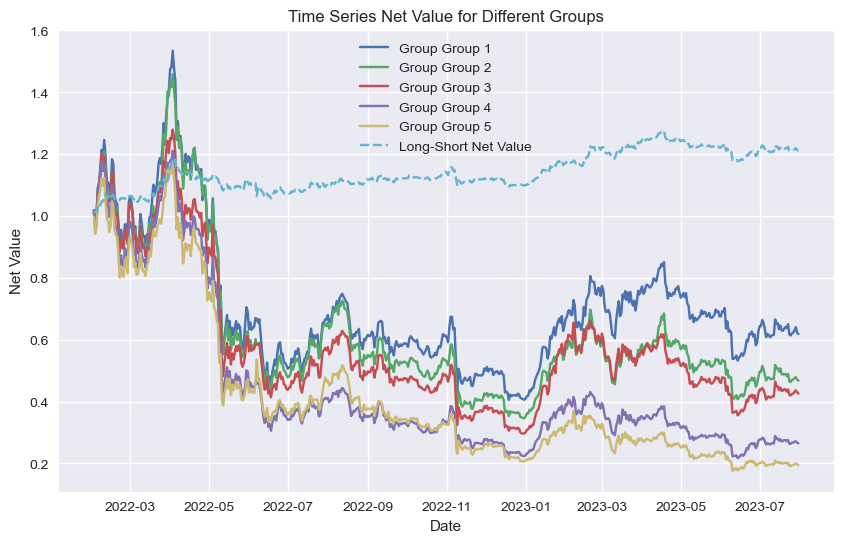

In [159]:
# 减去费用之前
LS_value_2022 = long_short(net_value_2022)

In [161]:
max_drawdown_2022 = calculate_drawdown(LS_value_2022)

LS_value_2022

Max Drawdown: Long_Short_Net_Value   -0.105807
dtype: float64
Max Drawdown Date: Long_Short_Net_Value   2022-06-18
dtype: datetime64[ns]


,Long_Short_Net_Value
2022-02-01,1.010211
2022-02-02,1.013627
2022-02-03,1.012209
2022-02-04,1.027882
2022-02-05,1.022402
...,...
2023-07-27,1.213600
2023-07-28,1.216077
2023-07-29,1.219649
2023-07-30,1.212634


In [180]:
net_value_fee_2023 = net_value_fee(5, pv_corr_avg_2023, return_2023)

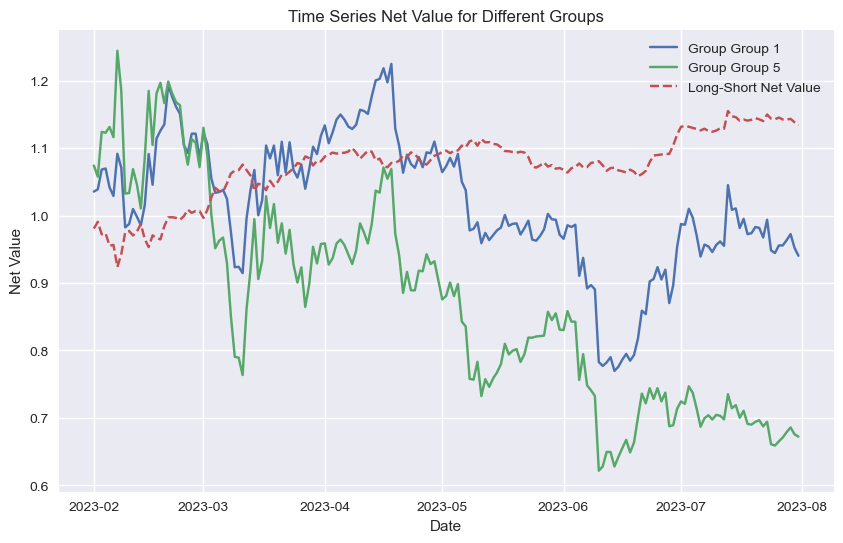

Max Drawdown: Long_Short_Net_Value    0.067642
dtype: float64
Max Drawdown Date: Long_Short_Net_Value   2023-02-07
dtype: datetime64[ns]


,Long_Short_Net_Value
2023-02-01,0.980715
2023-02-02,0.990637
2023-02-03,0.972049
2023-02-04,0.973495
2023-02-05,0.955170
...,...
2023-07-27,1.142353
2023-07-28,1.142262
2023-07-29,1.143266
2023-07-30,1.138231


In [198]:
# 减去费用之后的
ls_value_fee_2023 = long_short(net_value_fee_2023)

max_drawdown_2023 = calculate_drawdown(ls_value_fee_2023)

ls_value_fee_2023

In [199]:
net_value_fee_2022 = net_value_fee(5, pv_corr_avg_2022, return_2022)

In [185]:
net_value_fee_2022

,Group 1,Group 2,Group 3,Group 4,Group 5
2022-02-01,1.016792,1.021439,1.018387,0.998170,1.003749
2022-02-02,0.970678,0.972487,0.966093,0.950048,0.957753
2022-02-03,0.987955,0.991761,0.984353,0.973929,0.973234
2022-02-04,1.080382,1.083390,1.068034,1.059495,1.049845
2022-02-05,1.103625,1.103796,1.112299,1.079686,1.066793
...,...,...,...,...,...
2023-07-27,0.644042,0.536271,0.245333,0.305032,0.245252
2023-07-28,0.649340,0.541873,0.248931,0.308023,0.248190
2023-07-29,0.655336,0.549251,0.252057,0.309697,0.250705
2023-07-30,0.641676,0.535525,0.248079,0.306255,0.246982


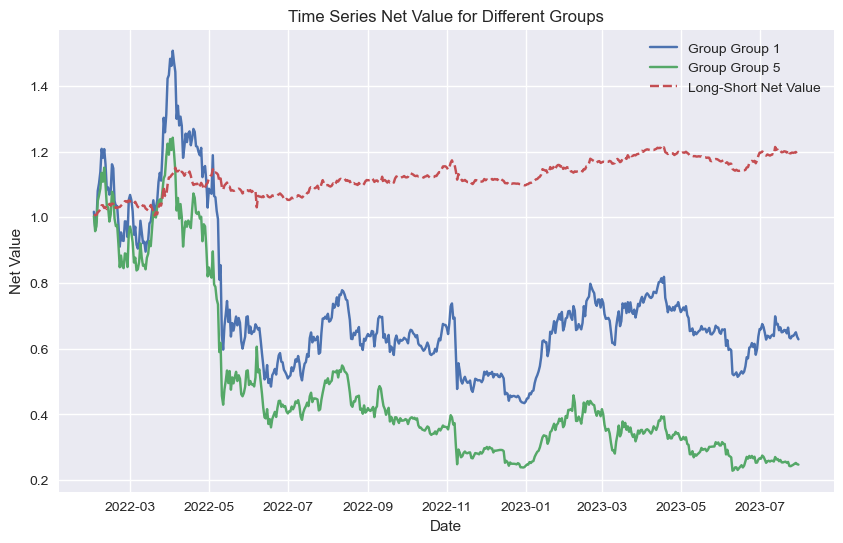

Max Drawdown: Long_Short_Net_Value    0.104854
dtype: float64
Max Drawdown Date: Long_Short_Net_Value   2022-06-07
dtype: datetime64[ns]


,Long_Short_Net_Value
2022-02-01,1.006521
2022-02-02,1.006485
2022-02-03,1.007375
2022-02-04,1.015241
2022-02-05,1.018379
...,...
2023-07-27,1.195915
2023-07-28,1.197061
2023-07-29,1.198766
2023-07-30,1.193870


In [204]:
# 减去费用之后的
ls_value_fee_2022 = long_short(net_value_fee_2022)

max_drawdown_2022 = calculate_drawdown(ls_value_fee_2022)

ls_value_fee_2022

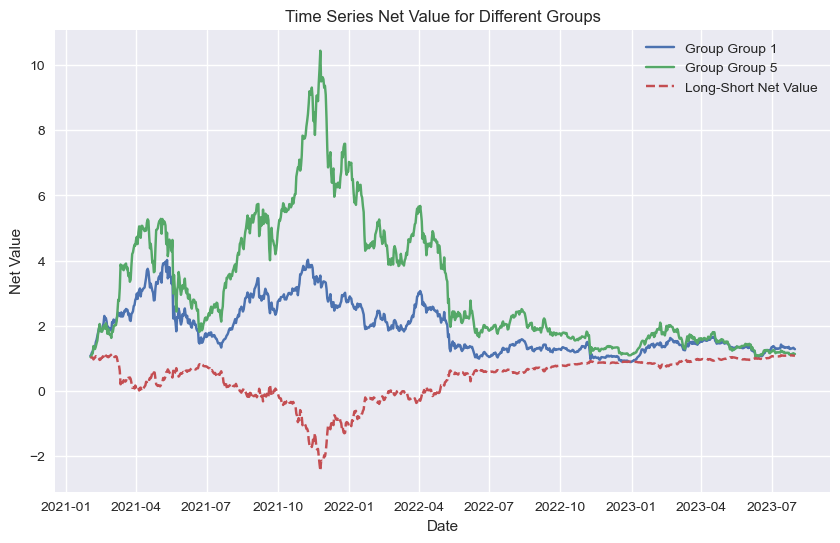

Max Drawdown: Long_Short_Net_Value    3.146179
dtype: float64
Max Drawdown Date: Long_Short_Net_Value   2021-11-25
dtype: datetime64[ns]


,Long_Short_Net_Value
2021-02-01,1.017982
2021-02-02,1.020063
2021-02-03,1.023492
2021-02-04,1.025290
2021-02-05,0.965590
...,...
2023-07-27,1.085542
2023-07-28,1.084121
2023-07-29,1.084377
2023-07-30,1.079169


In [201]:
# 减去费用之后的
net_value_fee_2021 = net_value_fee(5, pv_corr_avg_2021, return_2021)

ls_value_fee_2021 = long_short(net_value_fee_2021)

max_drawdown_2021 = calculate_drawdown(ls_value_fee_2021)

ls_value_fee_2021

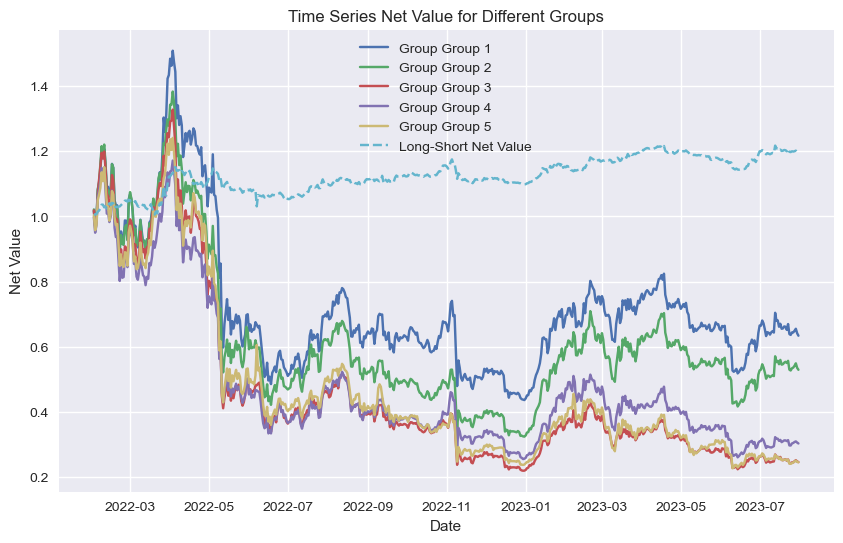

Max Drawdown: Long_Short_Net_Value    0.105017
dtype: float64
Max Drawdown Date: Long_Short_Net_Value   2022-06-07
dtype: datetime64[ns]


,Long_Short_Net_Value
2022-02-01,1.006021
2022-02-02,1.005962
2022-02-03,1.006861
2022-02-04,1.014769
2022-02-05,1.017916
...,...
2023-07-27,1.198895
2023-07-28,1.200075
2023-07-29,1.201815
2023-07-30,1.196847


In [177]:
# 减去费用之后的
ls_value_fee_2022 = long_short(net_value_fee_2022)

max_drawdown_2022 = calculate_drawdown(ls_value_fee_2022)

ls_value_fee_2022

In [175]:
import pandas as pd

start_date = ls_value_fee_2022.index.min()
end_date = ls_value_fee_2022.index.max()

# 计算总交易天数
total_trading_days = (end_date - start_date).days + 1

# 计算包含的年份
years = ls_value_fee_2022.index.year.unique()

# 根据年份计算每年的交易天数
trading_days_per_year = {}
for year in years:
    year_data = ls_value_fee_2022[str(year)]
    year_start = year_data.index.min()
    year_end = year_data.index.max()
    trading_days = (year_end - year_start).days + 1
    trading_days_per_year[year] = trading_days

print("Total Trading Days:", total_trading_days)
print("Trading Days Per Year:", trading_days_per_year)


Total Trading Days: 546
Trading Days Per Year: {2022: 334, 2023: 212}


In [205]:
print(ls_value_fee_2022)

            Long_Short_Net_Value
2022-02-01              1.006521
2022-02-02              1.006485
2022-02-03              1.007375
2022-02-04              1.015241
2022-02-05              1.018379
...                          ...
2023-07-27              1.195915
2023-07-28              1.197061
2023-07-29              1.198766
2023-07-30              1.193870
2023-07-31              1.190571

[546 rows x 1 columns]


In [206]:
def calculate_win_rate(ls_value_fee):
    
    trade_outcomes = (ls_value_fee['Long_Short_Net_Value'] > 1).astype(int)
    
    # trade_outcomes is a list of trade outcomes (1 for win, 0 for loss)
    total_trades = len(trade_outcomes)
    win_trades = sum(trade_outcomes)
    
    if total_trades == 0:
        return 0.0
    
    win_rate = win_trades / total_trades
    return win_rate

win_rate_2022 = calculate_win_rate(ls_value_fee_2022)
print(f"Win Rate 2022: {win_rate_2022:.2%}")

win_rate_2023 = calculate_win_rate(ls_value_fee_2023)
print(f"Win Rate 2023: {win_rate_2023:.2%}")

win_rate_2021 = calculate_win_rate(ls_value_fee_2021)
print(f"Win Rate 2021: {win_rate_2021:.2%}")

Win Rate 2022: 100.00%
Win Rate 2023: 86.19%
Win Rate 2021: 9.11%


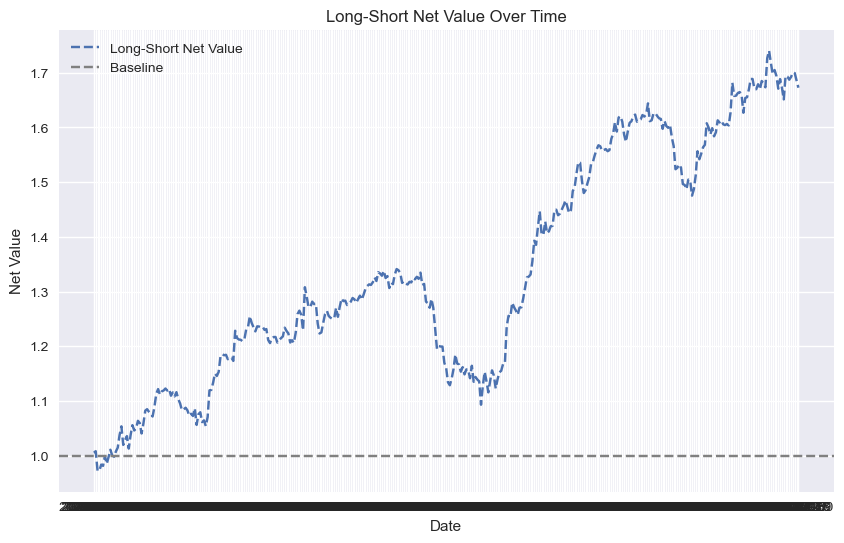

In [68]:
# 创建一个图形对象和一个轴对象
fig, ax = plt.subplots(figsize=(10, 6))

# 绘制净值数据
ax.plot(long_short_net_values1.index, long_short_net_values1, linestyle='--',label='Long-Short Net Value')

# 添加基线1
ax.axhline(y=1, color='gray', linestyle='--', label='Baseline')

# 设置图表标题和标签
ax.set_title('Long-Short Net Value Over Time')
ax.set_xlabel('Date')
ax.set_ylabel('Net Value')
ax.legend()

# 根据净值大于还是小于1，设置不同的颜色填充区域
# ax.fill_between(long_short_net_values1.index, 1, long_short_net_values1, where=(long_short_net_values1 > 1), facecolor='green', alpha=0.3, label='Above 1')
# ax.fill_between(long_short_net_values1.index, 1, long_short_net_values1, where=(long_short_net_values1 < 1), facecolor='red', alpha=0.3, label='Below 1')

# 显示图表
plt.show()

#### 多空可视化

In [15]:
import matplotlib.pyplot as plt

def long_short_visual(long_short_net_values_df):
    # 创建一个图形对象和一个轴对象
    fig, ax = plt.subplots(figsize=(10, 6))

    # 绘制净值数据
    ax.plot(long_short_net_values_df.index, long_short_net_values_df['Long_Short_Net_Value'], label='Long-Short Net Value')

    # 添加基线1
    ax.axhline(y=1, color='gray', linestyle='--', label='Baseline')

    # 设置图表标题和标签
    ax.set_title('Long-Short Net Value Over Time')
    ax.set_xlabel('Date')
    ax.set_ylabel('Net Value')
    ax.legend()

    # 根据净值大于还是小于1，设置不同的颜色填充区域
    ax.fill_between(long_short_net_values_df.index, 1, long_short_net_values_df['Long_Short_Net_Value'], where=(long_short_net_values_df['Long_Short_Net_Value'] > 1), facecolor='green', alpha=0.3, label='Above 1')
    ax.fill_between(long_short_net_values_df.index, 1, long_short_net_values_df['Long_Short_Net_Value'], where=(long_short_net_values_df['Long_Short_Net_Value'] < 1), facecolor='red', alpha=0.3, label='Below 1')

    # 显示图表
    plt.show()

In [129]:
def visual_whole(net_value, long_short_net_values_df):
    # 创建一个绘图区域
    plt.figure(figsize=(10, 6))

    # 循环遍历不同组别，绘制时序净值走势图
    for group in net_value.columns:
        plt.plot(pd.to_datetime(net_value.index), net_value[group], label=f'Group {group}')
        
    # 绘制净值数据
    plt.plot(long_short_net_values_df.index, long_short_net_values_df['Long_Short_Net_Value'],linestyle='--', label='Long-Short Net Value')
    
    # 添加图例、标题和标签
    plt.legend()
    plt.title('Time Series Net Value for Different Groups')
    plt.xlabel('Date')
    plt.ylabel('Net Value')


    # 显示图表
    plt.show()

In [131]:
long_short_net_value_2023

,Long_Short_Net_Value
2023-02-01,0.979756
2023-02-02,1.001343
2023-02-03,0.981022
2023-02-04,0.991852
2023-02-05,0.981894
...,...
2023-07-27,1.745347
2023-07-28,1.736948
2023-07-29,1.734459
2023-07-30,1.721976


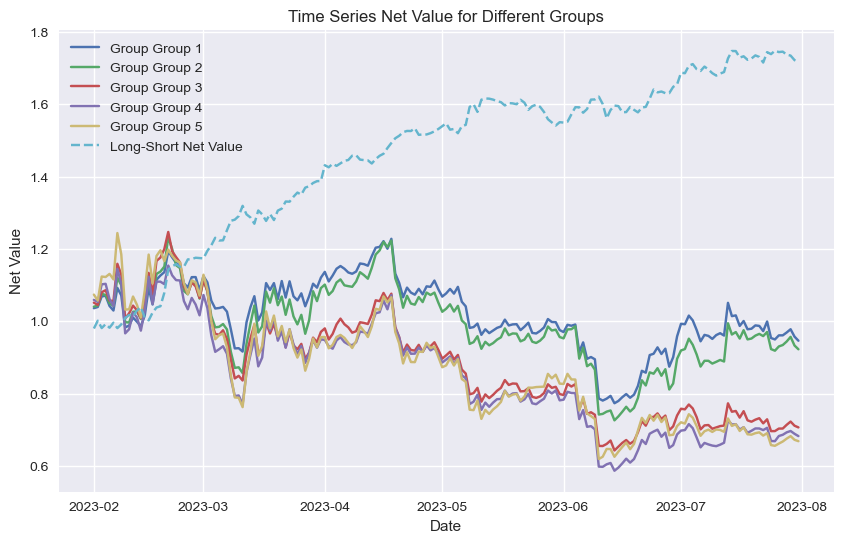

In [130]:
visual_whole(net_value_2023, long_short_net_value_2023)

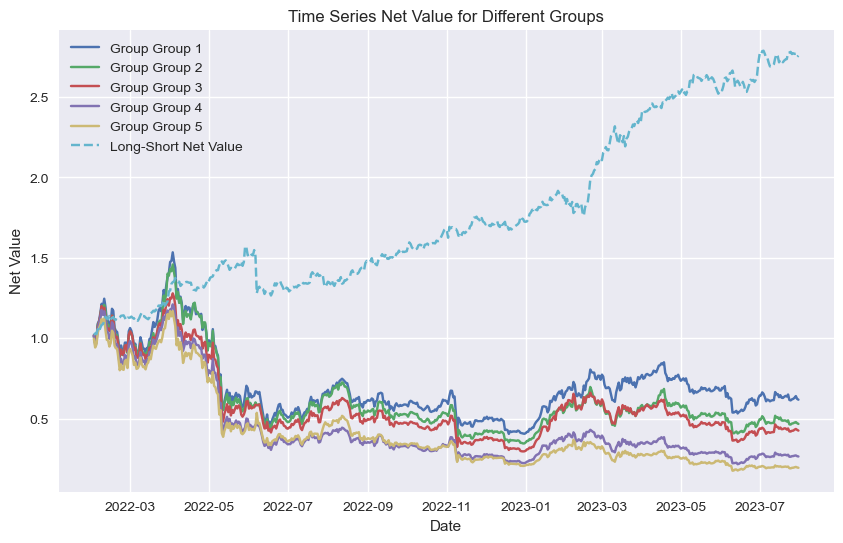

In [124]:
visual_whole(net_value_2022, long_short_net_value_2022)

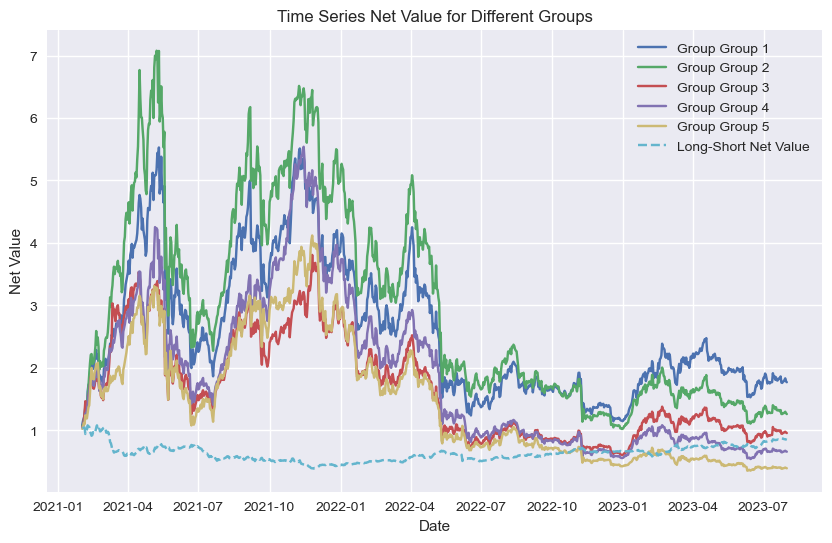

In [125]:
visual_whole(net_value_2021, long_short_net_value_2021)

## 第三版：进行v3：使用pv_corr为指标计算，年化指标的计算
### fee的正确计算调整，cumsum()，week period

In [51]:
import re
import os
import warnings
import numpy as np
import pandas as pd
from typing import *
from tqdm import tqdm, trange
import matplotlib.pyplot as plt
from functools import lru_cache
from scipy.stats import pearsonr
from concurrent.futures import ThreadPoolExecutor

warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8')


class CFG:
    read_path = r'D:\resampled_data'
    files = os.listdir(read_path)


def find_first_monday(start: str, end: str) -> Tuple[int, int]:
    first_day = pd.to_datetime(start)
    weekday = first_day.weekday()
    days_to_monday = (7 - weekday) % 7
    first_monday = first_day + pd.Timedelta(days=days_to_monday)
    num_weeks = (pd.to_datetime(end) - first_monday).days // 7
    string = f"binance-futures_trades_{first_monday.strftime('%Y-%m-%d')}_PERPETUALS.csv"
    return CFG.files.index(string), num_weeks


def correlation_calculate(group: pd.DataFrame) -> pd.Series:
    correlation_coefficient, _ = pearsonr(group['price'], group['amount'])  # _为P-value
    return pd.Series({'correlation_coefficient': correlation_coefficient})


@lru_cache()
def day_calculate(file: str) -> pd.Series:
    df = pd.read_csv(os.path.join(CFG.read_path, file), usecols=['symbol', 'price', 'amount'])
    correlation_results = df.groupby('symbol').apply(correlation_calculate).reset_index()
    date = re.search(r'\d{4}-\d{2}-\d{2}', file)
    return correlation_results.set_index('symbol').rename(columns={'correlation_coefficient': f'{date.group()}'})


def daily_close(file: str) -> pd.Series:
    df = pd.read_csv(os.path.join(CFG.read_path, file), usecols=['symbol', 'timestamp', 'price'])
    date = re.search(r'\d{4}-\d{2}-\d{2}', file)
    tn = pd.to_datetime(date.group()).replace(hour=23, minute=59, second=00)
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    df = df[df.timestamp == tn]
    # if df['symbol'].duplicated().any():
    #     print(f'数据存在问题')
    del df['timestamp']
    return df.set_index('symbol').rename(columns={'price': f'{date.group()}'})


def daily_IC(df1: pd.DataFrame, df2: pd.DataFrame, date: str, window: int, rank: bool = False) -> pd.Series:
    date_ = (pd.to_datetime(date) + pd.Timedelta(days=window)).strftime('%Y-%m-%d')
    dt_ = (pd.to_datetime(date) + pd.Timedelta(days=window - 1)).strftime('%Y-%m-%d')
    x, y = df1.loc[:, date: dt_], df2[date_]
    df = pd.concat([x, y], axis=1)
    df.dropna(how='any', axis=0, inplace=True)
    # valid_indices = np.logical_and(~np.isnan(x), ~np.isnan(y))
    # x_, y_ = x[valid_indices], y[valid_indices]
    x_avg, x_std, y_ = df.iloc[:, :-1].mean(axis=1), df.iloc[:, :-1].std(axis=1), df.iloc[:, -1].values
    x_pv_corr = (x_avg - x_avg.mean()) / x_avg.std() + (x_std - x_std.mean()) / x_std.std()
    if rank:
        x_pv_corr = np.argsort(np.argsort(x_pv_corr.values)) + 1
    correlation = pearsonr(x_pv_corr, y_)[0]
    return pd.Series({f'{date_}': correlation})


def ratio(float_: float) -> str:
    return '{:.2%}'.format(float_)


class ComputeFactors:
    def __init__(self, start: str, end: str, group_num: int, freq: str, fee: float):
        self.fee = fee
        self.end = end
        self.start = start
        self.freq = freq
        self.group_num = group_num
        self.dates = pd.date_range(start=start, end=end, freq='D').strftime('%Y-%m-%d')[:-1]
        self.groups = [f'Group{n}' for n in range(1, group_num + 1)]
        self.months = pd.date_range(start=start, end=end, freq='M').strftime('%Y-%m')
        self.first_monday, self.weeks = find_first_monday(start=start, end=end)

    @staticmethod
    def month_calculate(timestamp: str, factor_type: str, concat: bool = False) -> pd.DataFrame:
        specific_month = [file for file in CFG.files if file.startswith(f'binance-futures_trades_{timestamp}')]
        with ThreadPoolExecutor() as executor:
            df = pd.concat(list(executor.map(day_calculate, specific_month)), axis=1)
        if concat:
            if factor_type == 'avg':
                return df.mean(axis=1, skipna=True).rename(timestamp, inplace=True)
            if factor_type == 'std':
                return df.std(axis=1, skipna=True, ddof=1).rename(timestamp, inplace=True)
        return df

    def week_calculate(self, week: int, factor_type: str, concat: bool = False) -> pd.DataFrame:

        specific_week = CFG.files[self.first_monday + 7 * week: self.first_monday + 7 * (week + 1)]
        with ThreadPoolExecutor() as executor:
            df = pd.concat(list(executor.map(day_calculate, specific_week)), axis=1)
        if concat:
            if factor_type == 'avg':
                return df.mean(axis=1, skipna=True).rename(week, inplace=True)
            if factor_type == 'std':
                return df.std(axis=1, skipna=True, ddof=1).rename(week, inplace=True)
        return df

    @lru_cache()
    def pv_corr_(self, factor_type: str) -> pd.DataFrame:
        if self.freq == 'month':
            with ThreadPoolExecutor() as executor:
                df = pd.concat(list(executor.map(lambda dt: self.month_calculate(timestamp=dt,
                                                                                 concat=True,
                                                                                 factor_type=factor_type),
                                                 self.months)), axis=1)
            return df
        elif self.freq == 'week':
            with ThreadPoolExecutor() as executor:
                df = pd.concat(list(executor.map(lambda wk: self.week_calculate(week=wk,
                                                                                concat=True,
                                                                                factor_type=factor_type),
                                                 range(self.weeks))), axis=1)
            return df

    def pv_corr(self) -> pd.DataFrame:
        pv_corr_avg = self.pv_corr_(factor_type='avg').apply(lambda x: (x - x.mean()) / x.std(),
                                                             axis=1)
        pv_corr_std = self.pv_corr_(factor_type='std').apply(lambda x: (x - x.mean()) / x.std(),
                                                             axis=1)
        return pv_corr_avg + pv_corr_std

    @lru_cache()
    def return_calculate(self):
        if self.freq == 'month':
            specific_day = list(map(lambda date: f'binance-futures_trades_{date}_PERPETUALS.csv', self.dates))
        elif self.freq == 'week':
            specific_day = CFG.files[self.first_monday: self.first_monday + self.weeks * 7]
        with ThreadPoolExecutor() as executor:
            df = pd.concat(list(executor.map(daily_close, specific_day)), axis=1)
        return df.pct_change(axis=1)

    def daily_correlation(self):
        if self.freq == 'month':
            specific_day = list(map(lambda date: f'binance-futures_trades_{date}_PERPETUALS.csv', self.dates))
        elif self.freq == 'week':
            specific_day = CFG.files[self.first_monday: self.first_monday + self.weeks * 7]
        with ThreadPoolExecutor() as executor:
            df = pd.concat(list(executor.map(day_calculate, specific_day)), axis=1)
        return df

    def IC(self, window: int, rank: bool = False):
        dc = self.daily_correlation()
        returns = self.return_calculate()
        if self.freq == 'month':
            with ThreadPoolExecutor() as executor:
                df = pd.concat(
                    list(executor.map(
                        lambda date: daily_IC(df1=dc, df2=returns, date=date, rank=rank, window=window),
                        self.dates[:-window]))
                )
            name = 'RankIC' if rank else 'IC'
            return df.rename(f'{name}', inplace=True)
        elif self.freq == 'week':
            with ThreadPoolExecutor() as executor:
                df = pd.concat(
                    list(executor.map(
                        lambda date: daily_IC(df1=dc, df2=returns, date=date, rank=rank, window=window),
                        dc.columns[:-window]))
                )
            name = 'RankIC' if rank else 'IC'
            return df.rename(f'{name}', inplace=True)

    @lru_cache()
    def quantile(self, factor_type='pv_corr') -> pd.DataFrame:

        def group_by_quantiles(column):
            return pd.qcut(column, q=self.group_num, labels=self.groups, duplicates='drop')

        if factor_type == 'pv_corr':
            grouped_df = self.pv_corr().apply(group_by_quantiles, axis=0)
        else:
            grouped_df = self.pv_corr_(factor_type=factor_type).apply(group_by_quantiles, axis=0)
        return grouped_df

    def group_calculate_month_sum(self, timestamp: str, factor_type: str = 'pv_corr') -> Tuple[pd.DataFrame, pd.Series]:
        returns = self.return_calculate()
        dates = (pd.date_range(start=timestamp,
                               end=pd.to_datetime(timestamp) + pd.DateOffset(months=1),
                               freq='D')).strftime('%Y-%m-%d').tolist()
        return_month = returns.loc[:, dates[:-1]]
        quantile_month = (pd.to_datetime(timestamp) - pd.DateOffset(months=1)).strftime('%Y-%m')
        quantile_df = self.quantile(factor_type=factor_type)
        df = quantile_df.loc[:, [quantile_month, timestamp]]
        df.dropna(how='any', axis=0, inplace=True)

        def group_(group: str) -> pd.Series:
            common_index = df[df[quantile_month] == group].index
            return_group = return_month.loc[common_index, :]
            return_group.iloc[:, [0, -1]] = return_group.iloc[:, [0, -1]] - self.fee
            cumulate_return = return_group.cumsum(axis=1, skipna=True).mean(axis=0)
            return cumulate_return.rename(group, inplace=True)

        def group5() -> pd.Series:
            common_index = df[df[quantile_month] == self.groups[-1]].index
            return_group = return_month.loc[common_index, :]
            daily_return = return_group.cumsum(axis=1, skipna=True)
            return_group.iloc[:, [0, -1]] = return_group.iloc[:, [0, -1]] + self.fee
            cumulate_return = daily_return.mean(axis=0)
            return cumulate_return

        with ThreadPoolExecutor() as executor:
            return_groups = pd.concat(
                list(executor.map(group_, self.groups)),
                axis=1
            )
        return return_groups, group5()

    def group_calculate_week_sum(self, week: int, factor_type: str = 'pv_corr') -> Tuple[pd.DataFrame, pd.Series]:
        returns = self.return_calculate()
        return_week = returns.iloc[:, week * 7: (week + 1) * 7]
        quantile_df = self.quantile(factor_type=factor_type)
        pre_df = quantile_df.loc[:, [week - 1, week]]
        pre_df.dropna(how='any', axis=0, inplace=True)

        def group_(group: str) -> pd.Series:
            common_index = pre_df[pre_df[week - 1] == group].index
            return_group = return_week.loc[common_index, :]
            if week == 1:
                return_group.iloc[:, 0] = return_group.iloc[:, 0] - self.fee
                for idx in common_index:
                    if pre_df.loc[idx, week - 1] != pre_df.loc[idx, week]:
                        return_group.loc[idx, :][-1] = return_group.loc[idx, :][-1] - self.fee
            elif week == self.weeks - 1:
                df = quantile_df.loc[:, [week - 2, week - 1, week]]
                for idx in common_index:
                    if df.loc[idx, week - 2] != df.loc[idx, week - 1]:
                        return_group.loc[idx, :][0] = return_group.loc[idx, :][0] - self.fee
                return_group.iloc[:, -1] = return_group.iloc[:, -1] - self.fee
            else:
                df = quantile_df.loc[:, [week - 2, week - 1, week]]
                for idx in common_index:
                    if df.loc[idx, week - 2] != df.loc[idx, week - 1]:
                        return_group.loc[idx, :][0] = return_group.loc[idx, :][0] - self.fee
                    if df.loc[idx, week - 1] != df.loc[idx, week]:
                        return_group.loc[idx, :][-1] = return_group.loc[idx, :][-1] - self.fee
            cumulate_return = return_group.cumsum(axis=1, skipna=True).mean(axis=0)

            return cumulate_return.rename(group, inplace=True)

        def group5() -> pd.Series:
            common_index = pre_df[pre_df[week - 1] == self.groups[-1]].index
            return_group = return_week.loc[common_index, :]
            if week == 1:
                return_group.iloc[:, 0] = return_group.iloc[:, 0] + self.fee
                for idx in common_index:
                    if pre_df.loc[idx, week - 1] != pre_df.loc[idx, week]:
                        return_group.loc[idx, :][-1] = return_group.loc[idx, :][-1] + self.fee
            elif week == self.weeks - 1:
                df = quantile_df.loc[:, [week - 2, week - 1, week]]
                for idx in common_index:
                    if df.loc[idx, week - 2] != df.loc[idx, week - 1]:
                        return_group.loc[idx, :][0] = return_group.loc[idx, :][0] + self.fee
                return_group.iloc[:, -1] = return_group.iloc[:, -1] + self.fee
            else:
                df = quantile_df.loc[:, [week - 2, week - 1, week]]
                for idx in common_index:
                    if df.loc[idx, week - 2] != df.loc[idx, week - 1]:
                        return_group.loc[idx, :][0] = return_group.loc[idx, :][0] + self.fee
                    if df.loc[idx, week - 1] != df.loc[idx, week]:
                        return_group.loc[idx, :][-1] = return_group.loc[idx, :][-1] + self.fee
            cumulate_return = return_group.cumsum(axis=1, skipna=True).mean(axis=0)
            return cumulate_return

        with ThreadPoolExecutor() as executor:
            return_groups = pd.concat(
                list(executor.map(group_, self.groups)),
                axis=1
            )
        return return_groups, group5()

    @lru_cache()
    def networth_trend_sum(self, factor_type: str = 'pv_corr'):
        swap_assets = [0] * (self.group_num + 1)
        res = []
        if self.freq == 'month':
            for month in tqdm(self.months[1:]):
                df, hedge_group5 = self.group_calculate_month_sum(timestamp=month, factor_type=factor_type)
                ls = df[self.groups[0]] - hedge_group5
                df.insert(column='Group1 hedges Group5', loc=self.group_num, value=ls.values)
                df = df.add(swap_assets, axis=1)
                swap_assets = df.iloc[-1, :].tolist()
                res.append(df)
        elif self.freq == 'week':
            for week in trange(1, self.weeks):
                df, hedge_group5 = self.group_calculate_week_sum(week=week, factor_type=factor_type)
                ls = df[self.groups[0]] - hedge_group5
                df.insert(column='Group1 hedges Group5', loc=self.group_num, value=ls.values)
                df = df.add(swap_assets, axis=1)
                swap_assets = df.iloc[-1, :].tolist()
                res.append(df)
        groups_trend = pd.concat(res, axis=0)
        return groups_trend

    def hedges_return_week(self, week: int, factor_type: str = 'pv_corr'):
        returns = self.return_calculate()
        return_week = returns.iloc[:, week * 7: (week + 1) * 7]
        quantile_df = self.quantile(factor_type=factor_type)
        df = quantile_df.loc[:, [week - 1, week]]
        df.dropna(how='any', axis=0, inplace=True)

        def group1() -> pd.Series:
            common_index = df[df[week - 1] == self.groups[0]].index
            return_group = return_week.loc[common_index, :]
            return return_group.mean(axis=0)

        def group5() -> pd.Series:
            common_index = df[df[week - 1] == self.groups[-1]].index
            return_group = return_week.loc[common_index, :]
            return return_group.mean(axis=0)

        return group1() - group5()

    @lru_cache()
    def index_calculate(self, factor_type: str = 'pv_corr') -> pd.Series:

        net_value = self.networth_trend_sum(factor_type=factor_type)['Group1 hedges Group5']
        final_portfolio = net_value.iloc[-1]
        annualized_return = final_portfolio * (365 / len(net_value))
        with ThreadPoolExecutor() as executor:
            hedges_return = pd.concat(list(executor.map(
                lambda wk: self.hedges_return_week(week=wk, factor_type=factor_type), range(1, self.weeks))),
                axis=0)
        annualized_std = np.sqrt(np.var(hedges_return.values, ddof=0) * 365)
        sharpe = (annualized_return - 0.03) / annualized_std
        rolling_max = net_value.expanding(min_periods=1).max()
        draw_down = np.abs(net_value - rolling_max) / rolling_max
        maximum_draw_down = draw_down.max()
        calmar = annualized_return / maximum_draw_down
        wins = net_value.diff(periods=1)
        wins.iloc[0] = net_value.iloc[0]
        win_rate = (wins > 0).mean()

        ids = pd.Series(
            {
                'final_portfolio': round(final_portfolio, 2),
                'annualized_return': ratio(annualized_return),
                'annualized_std': ratio(annualized_std),
                'sharpe': round(sharpe, 2),
                'maximum_draw_down': ratio(maximum_draw_down),
                'calmar': round(calmar, 2),
                'win_rate': ratio(win_rate),
            }
        )
        return ids


class Plot:
    @staticmethod
    def boxplot(df: pd.Series, y_label: str, title: str, threshold: float):
        ratio_ = (df.abs() > threshold).mean()
        plt.figure(figsize=(13, 5), dpi=540)
        plt.boxplot(df, showmeans=True)
        plt.ylabel(f'{y_label}',
                   fontsize=15,
                   fontweight='bold'
                   )
        plt.title(label=f'{title} Ratio(abs>{threshold}): {round(ratio_ * 100, 1)}%',
                  fontsize=15,
                  fontweight='bold'
                  )
        plt.axhspan(ymin=-threshold, ymax=threshold, facecolor='purple', alpha=0.3)
        plt.axhline(y=0.0, c='red')
        plt.show()

    @staticmethod
    def scatterplot(df: pd.Series, y_label: str, title: str, threshold: float):
        ratio = (df.abs() > threshold).mean()
        plt.figure(figsize=(13, 5), dpi=540)
        plt.scatter(y=df.values, x=pd.to_datetime(df.index))
        plt.ylabel(f'{y_label}',
                   fontsize=15,
                   fontweight='bold'
                   )
        plt.title(label=f'{title} Ratio(abs>{threshold}): {round(ratio * 100, 1)}%',
                  fontsize=15,
                  fontweight='bold'
                  )
        plt.axhspan(ymin=-threshold, ymax=threshold, facecolor='purple', alpha=0.3)
        plt.axhline(y=0.0, c='red')
        plt.show()

    @staticmethod
    def trend_plot(df: pd.DataFrame, title: str):
        ax = df.plot()
        ax.figure.set_size_inches(13, 5)
        ax.figure.set_dpi(540)
        ax.legend(loc='best')
        ax.set_ylabel('NetValue',
                      fontsize=15,
                      fontweight='bold'
                      )
        ax.set_title(label=f'Trend of net value ({title})',
                     fontsize=15,
                     fontweight='bold'
                     )
        plt.show()

In [59]:
cf_v3 = ComputeFactors(start='2022-01', end='2023-08', group_num=5, freq='week', fee=0.0005)
pt = Plot()

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:01<00:00, 22.87it/s]


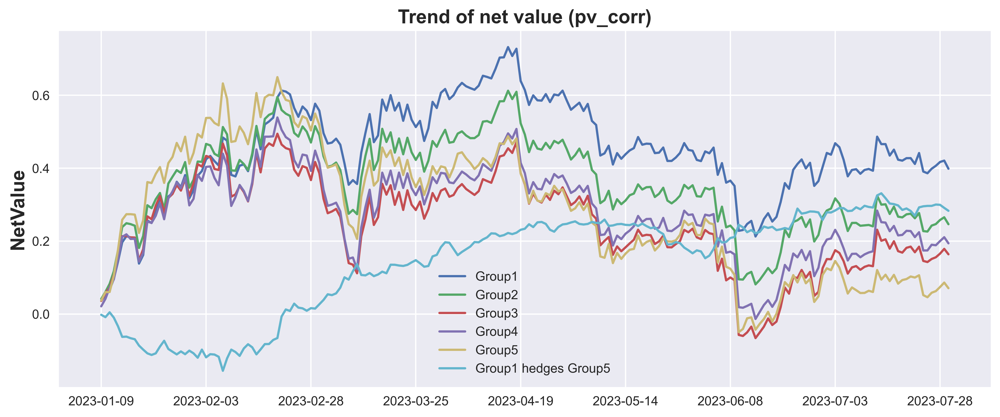

90.989


In [57]:
# 2023年
import time
begin = time.time()

pv_corr_2021 = cf_v3.pv_corr()
return_2021 = cf_v3.return_calculate()
quantile_df = cf_v3.quantile(factor_type='pv_corr')
net_worth = cf_v3.networth_trend_sum(factor_type='pv_corr')
pt.trend_plot(df = net_worth, title='pv_corr')
ids = cf_v3.index_calculate()

print(round(time.time() - begin, 3))

100%|██████████████████████████████████████████████████████████████████████████████████| 81/81 [00:03<00:00, 23.27it/s]


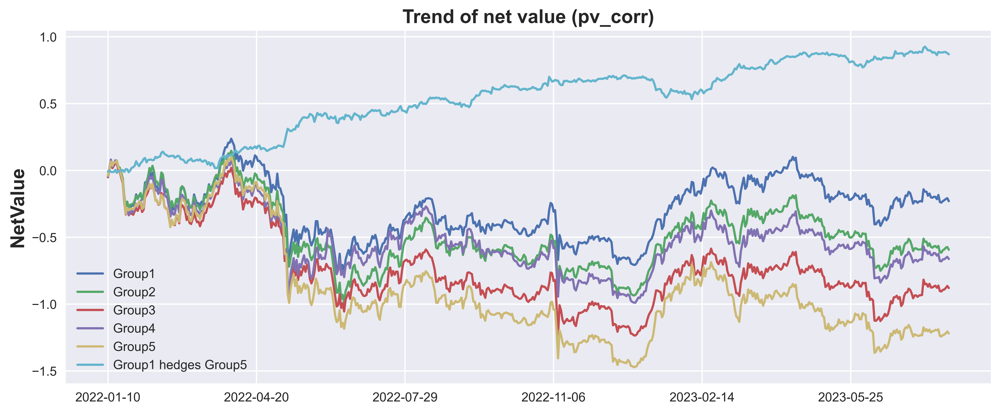

419.756


In [60]:
# 2022-2023年
import time
begin = time.time()

pv_corr_2021 = cf_v3.pv_corr()
return_2021 = cf_v3.return_calculate()
quantile_df = cf_v3.quantile(factor_type='pv_corr')
net_worth = cf_v3.networth_trend_sum(factor_type='pv_corr')
pt.trend_plot(df = net_worth, title='pv_corr')
ids = cf_v3.index_calculate()

print(round(time.time() - begin, 3))

100%|████████████████████████████████████████████████████████████████████████████████| 133/133 [00:04<00:00, 27.90it/s]


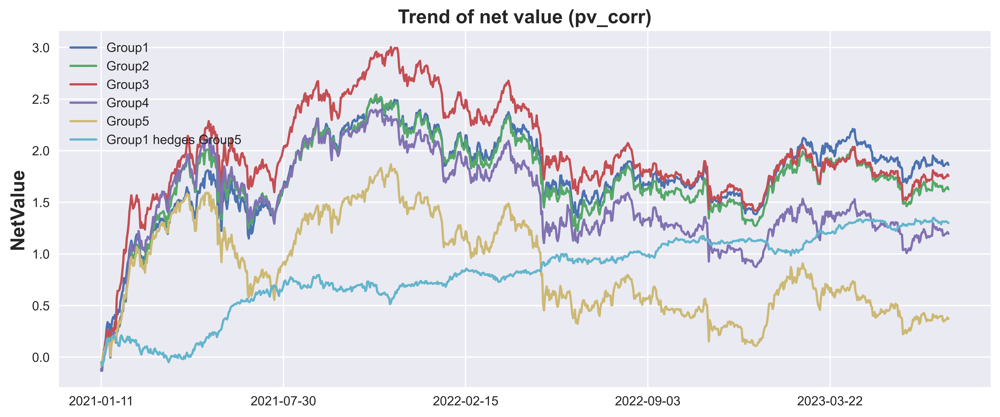

495.813


In [54]:
# 2021-2023年
import time
begin = time.time()

pv_corr_2021 = cf_v3.pv_corr()
return_2021 = cf_v3.return_calculate()
quantile_df = cf_v3.quantile(factor_type='pv_corr')
net_worth = cf_v3.networth_trend_sum(factor_type='pv_corr')
pt.trend_plot(df = net_worth, title='pv_corr')
ids = cf_v3.index_calculate()

print(round(time.time() - begin, 3))

In [79]:
begin = time.time()

quantile_df = cf_v3.quantile(factor_type='pv_corr')

print(round(time.time() - begin, 3))

350.804


In [81]:
begin = time.time()

net_worth = cf_v3.networth_trend_sum(factor_type='pv_corr')

print(round(time.time() - begin, 3))

100%|██████████████████████████████████████████████████████████████████████████████████| 81/81 [01:31<00:00,  1.14s/it]

91.982


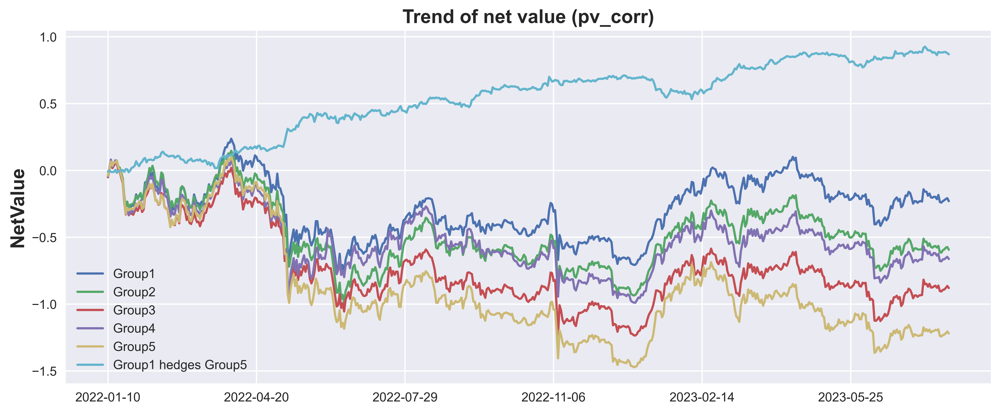

In [86]:
pt.trend_plot(df = net_worth, title='pv_corr')

In [89]:
begin = time.time()

ids = cf_v3.index_calculate()

print(round(time.time() - begin, 3))

100%|██████████████████████████████████████████████████████████████████████████████████| 81/81 [06:56<00:00,  5.14s/it]


416.843


In [97]:
pv_corr_2022

,0,1,2,3,4,5,6,7,8,9,...,72,73,74,75,76,77,78,79,80,81
symbol,,,,,,,,,,,,,,,,,,,,,
1000SHIBUSDT,-1.150502,0.234558,-1.409628,0.291941,2.414388,2.765271,-1.396900,-0.034722,0.659445,-1.809445,...,-0.685385,0.686171,-1.630945,1.402575,-0.022530,-0.823100,2.204718,1.669252,-0.084620,0.823979
1000XECUSDT,-0.606543,-0.366560,-0.190457,-1.509142,-0.611778,0.053792,-2.063948,-1.190934,-1.525154,3.248776,...,-0.433197,-2.020731,-1.475971,-1.863951,0.154312,2.837167,1.452164,2.330571,2.570711,2.803348
1INCHUSDT,-1.037939,0.125883,-1.322632,1.929729,-0.975576,-1.362053,1.379165,1.324606,-1.319831,0.003528,...,0.042792,-0.639410,-2.666384,-1.092458,0.911156,0.255895,-0.676217,3.594135,1.843472,-0.184744
AAVEUSDT,-0.247836,0.344059,-1.148341,-0.603634,0.485267,-2.182289,-2.553942,0.542405,-0.895551,0.271032,...,1.754978,-2.051827,0.141140,-0.376347,0.938022,3.556912,1.798645,2.400137,0.311395,3.674628
ADABUSD,-1.247989,0.655829,0.256841,1.672976,-0.351433,0.889184,-1.357922,0.074148,1.262901,-1.125272,...,0.084576,-2.468151,-2.110002,0.545235,0.579781,-1.102063,-1.148103,2.153665,-0.349580,-0.045091
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
XVGUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-1.691381,1.146818,1.547894,-1.003331
WLDUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ARKMUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [98]:
return_2022

,2022-01-03,2022-01-04,2022-01-05,2022-01-06,2022-01-07,2022-01-08,2022-01-09,2022-01-10,2022-01-11,2022-01-12,...,2023-07-21,2023-07-22,2023-07-23,2023-07-24,2023-07-25,2023-07-26,2023-07-27,2023-07-28,2023-07-29,2023-07-30
symbol,,,,,,,,,,,,,,,,,,,,,
1000SHIBUSDT,NaN,-0.018846,-0.064254,0.012652,-0.056127,-0.044262,0.019044,-0.055605,0.035605,0.138209,...,0.018194,-0.008296,0.010425,-0.023819,0.032098,-0.007206,-0.007386,0.048877,0.041707,-0.027709
1000XECUSDT,NaN,-0.031784,-0.075415,-0.009980,-0.046428,-0.021956,-0.002806,-0.064304,0.039764,0.050027,...,-0.010368,-0.026667,0.009132,-0.045895,-0.003049,0.003738,0.002370,0.005066,0.015793,0.035065
1INCHUSDT,NaN,-0.033882,-0.062990,0.009875,-0.068702,-0.026730,0.012389,-0.034619,0.034945,0.045687,...,0.021290,-0.023824,-0.002441,-0.069419,-0.006572,0.005954,0.003288,0.015077,0.019696,-0.011716
AAVEUSDT,NaN,-0.057393,-0.086171,-0.040612,-0.041516,0.002031,-0.012680,-0.046503,0.067598,0.025093,...,0.025386,-0.035522,0.007533,-0.027416,-0.002563,0.027405,0.006391,0.004694,0.021434,-0.047350
ADABUSD,NaN,-0.007732,-0.060810,0.040020,-0.054513,-0.022913,-0.009397,-0.040680,0.057372,0.105653,...,0.000000,-0.019620,0.022918,-0.037551,-0.005246,0.010877,0.002934,0.000000,0.016905,0.008632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
XVGUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.038786,-0.049677,0.012644,-0.079202,-0.080753,0.021136,-0.011212,0.018535,-0.000428,-0.010923
WLDUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.044831,-0.002615,-0.069019,0.057762,0.058354,-0.024647
ARKMUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.042251,-0.028126


In [80]:
quantile_df

,0,1,2,3,4,5,6,7,8,9,...,72,73,74,75,76,77,78,79,80,81
symbol,,,,,,,,,,,,,,,,,,,,,
1000SHIBUSDT,Group2,Group3,Group3,Group2,Group5,Group5,Group3,Group4,Group3,Group1,...,Group2,Group4,Group3,Group5,Group3,Group2,Group5,Group4,Group3,Group4
1000XECUSDT,Group2,Group2,Group4,Group1,Group2,Group4,Group1,Group2,Group1,Group5,...,Group2,Group1,Group3,Group1,Group3,Group5,Group5,Group5,Group5,Group5
1INCHUSDT,Group2,Group3,Group3,Group5,Group1,Group1,Group5,Group5,Group1,Group3,...,Group3,Group3,Group1,Group2,Group4,Group3,Group3,Group5,Group5,Group3
AAVEUSDT,Group3,Group3,Group3,Group1,Group3,Group1,Group1,Group4,Group1,Group3,...,Group5,Group1,Group4,Group3,Group4,Group5,Group5,Group5,Group4,Group5
ADABUSD,Group2,Group4,Group5,Group4,Group2,Group4,Group3,Group4,Group4,Group1,...,Group3,Group1,Group2,Group4,Group4,Group1,Group3,Group5,Group3,Group4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
XVGUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Group2,Group4,Group5,Group2
WLDUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ARKMUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [82]:
net_worth

,Group1,Group2,Group3,Group4,Group5,Group1 hedges Group5
2022-01-10,-0.045701,-0.049669,-0.050484,-0.043265,-0.039560,-0.007141
2022-01-11,0.006673,0.001118,0.008281,0.017785,0.006674,-0.001001
2022-01-12,0.058552,0.070091,0.066197,0.081503,0.067285,-0.009733
2022-01-13,0.024780,0.040886,0.017580,0.026270,0.035359,-0.011579
2022-01-14,0.053005,0.058997,0.035707,0.056179,0.061990,-0.009985
...,...,...,...,...,...,...
2023-07-26,-0.229287,-0.595890,-0.892756,-0.664946,-1.231518,0.883223
2023-07-27,-0.222013,-0.590272,-0.890281,-0.663772,-1.228026,0.887004
2023-07-28,-0.212894,-0.577059,-0.878379,-0.654484,-1.217276,0.885373
2023-07-29,-0.206917,-0.572651,-0.863679,-0.645960,-1.204031,0.878105


In [58]:
ids

final_portfolio          0.28
annualized_return      50.91%
annualized_std         24.58%
sharpe                   1.95
maximum_draw_down    3376.90%
calmar                   0.02
win_rate               51.72%
dtype: object

### 换手率计算

In [103]:
groups = pv_corr_2022.apply(lambda x: pd.qcut(x, q=5, labels=False, duplicates='drop'), axis=0)
groups

,0,1,2,3,4,5,6,7,8,9,...,72,73,74,75,76,77,78,79,80,81
symbol,,,,,,,,,,,,,,,,,,,,,
1000SHIBUSDT,1.0,2.0,2.0,1.0,4.0,4.0,2.0,3.0,2.0,0.0,...,1.0,3.0,2.0,4.0,2.0,1.0,4.0,3.0,2.0,3.0
1000XECUSDT,1.0,1.0,3.0,0.0,1.0,3.0,0.0,1.0,0.0,4.0,...,1.0,0.0,2.0,0.0,2.0,4.0,4.0,4.0,4.0,4.0
1INCHUSDT,1.0,2.0,2.0,4.0,0.0,0.0,4.0,4.0,0.0,2.0,...,2.0,2.0,0.0,1.0,3.0,2.0,2.0,4.0,4.0,2.0
AAVEUSDT,2.0,2.0,2.0,0.0,2.0,0.0,0.0,3.0,0.0,2.0,...,4.0,0.0,3.0,2.0,3.0,4.0,4.0,4.0,3.0,4.0
ADABUSD,1.0,3.0,4.0,3.0,1.0,3.0,2.0,3.0,3.0,0.0,...,2.0,0.0,1.0,3.0,3.0,0.0,2.0,4.0,2.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
XVGUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,3.0,4.0,1.0
WLDUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ARKMUSDT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [104]:
# 计算每个月的平均换手率
def turnover(groups):
    
    turnovers = []
    for week in range(1, len(groups.columns)):
        prev_week_group = groups.iloc[:, week - 1]
        curr_week_group = groups.iloc[:, week]
        turnover = 0
        valid_count = 0  # 记录有效货币数量（非NaN）

        for prev, curr in zip(prev_week_group, curr_week_group):
            if pd.notna(prev) and pd.notna(curr):
                valid_count += 1
                if prev == curr: # turnover = 0 if coin in the same group
                    turnover += 0
                elif (prev == 0 and curr == 4) or (prev == 4 and curr == 0): # turnover = 2 if coin in the hedge group
                    turnover += 2
                else:
                    turnover += 1
        # 避免除以0的情况
        if valid_count > 0:
            turnovers.append(turnover / valid_count)  # 换手率除以有效货币数量得到均值
            
    return turnovers

In [ ]:
turnovers_2022 = turnover(groups)

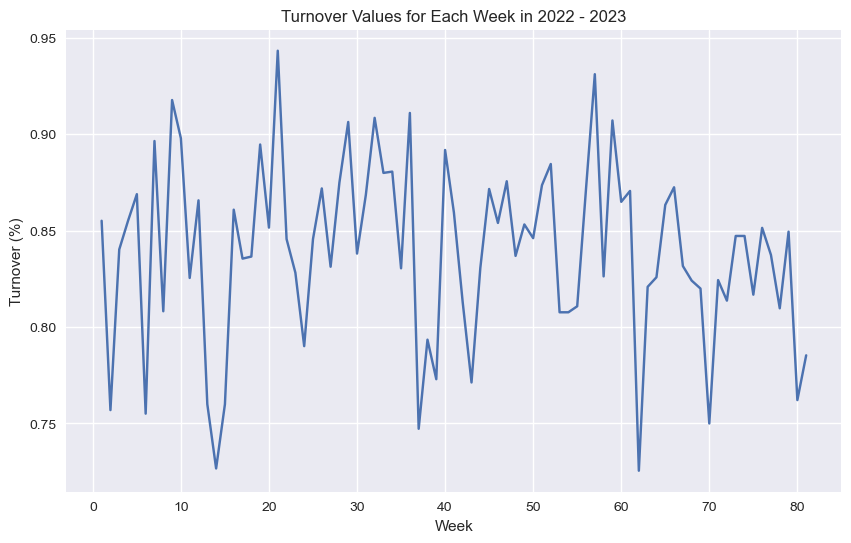

In [117]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(turnovers_2022) + 1), turnovers_2022)

# 添加标题和标签
plt.title('Turnover Values for Each Week in 2022 - 2023')
plt.xlabel('Week')
plt.ylabel('Turnover (%)')

# 显示图表
plt.show()

In [108]:
# 输出每个月的平均换手率
for idx, turnover in enumerate(turnovers_2022):
    print(f"Week {idx+1}: Average Turnover = {turnover * 100:.2f}%")

Week 1: Average Turnover = 85.52%
Week 2: Average Turnover = 75.69%
Week 3: Average Turnover = 84.03%
Week 4: Average Turnover = 85.52%
Week 5: Average Turnover = 86.90%
Week 6: Average Turnover = 75.51%
Week 7: Average Turnover = 89.66%
Week 8: Average Turnover = 80.82%
Week 9: Average Turnover = 91.78%
Week 10: Average Turnover = 89.80%
Week 11: Average Turnover = 82.55%
Week 12: Average Turnover = 86.58%
Week 13: Average Turnover = 76.00%
Week 14: Average Turnover = 72.67%
Week 15: Average Turnover = 76.00%
Week 16: Average Turnover = 86.09%
Week 17: Average Turnover = 83.55%
Week 18: Average Turnover = 83.66%
Week 19: Average Turnover = 89.47%
Week 20: Average Turnover = 85.16%
Week 21: Average Turnover = 94.34%
Week 22: Average Turnover = 84.57%
Week 23: Average Turnover = 82.82%
Week 24: Average Turnover = 79.01%
Week 25: Average Turnover = 84.57%
Week 26: Average Turnover = 87.20%
Week 27: Average Turnover = 83.13%
Week 28: Average Turnover = 87.50%
Week 29: Average Turnover = 9

In [214]:
monthly_turnovers

[0.7034482758620689,
 0.7808219178082192,
 0.7583892617449665,
 0.75,
 0.7,
 0.676829268292683,
 0.7745664739884393,
 0.7272727272727273,
 0.7297297297297297,
 0.7021276595744681,
 0.717391304347826,
 0.7417582417582418,
 0.7647058823529411,
 0.6865671641791045,
 0.6878048780487804,
 0.6567164179104478,
 0.6896551724137931,
 0.7560975609756098]

In [223]:
average_turnovers = pd.DataFrame(monthly_turnovers)
average_turnovers.columns = ['turnover']

In [224]:
average_turnovers

,turnover
0,0.724138
1,0.808219
2,0.778523
3,0.756579
4,0.718750
5,0.695122
6,0.803468
7,0.761364
8,0.772973
9,0.723404
